https://colab.research.google.com/github/zfurman56/polytopes/blob/main/Polytopes.ipynb#scrollTo=M7z5WMYcbJS6

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
# import plotly.graph_objs as go
# import plotly.express as px
import copy
from scipy.ndimage import gaussian_filter
from ipywidgets import interact, FloatSlider
import matplotlib.pyplot as plt

## Demo of linear region

In [2]:
class FeedForwardNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, hidden_layers):
        super(FeedForwardNN, self).__init__()
        self.layers = nn.ModuleList()

        # Input layer
        self.layers.append(nn.Linear(input_size, hidden_size))
        self.layers.append(nn.ReLU())

        # Hidden layers
        for _ in range(hidden_layers - 1):
            self.layers.append(nn.Linear(hidden_size, hidden_size))
            self.layers.append(nn.ReLU())

        # Output layer
        self.layers.append(nn.Linear(hidden_size, output_size))

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x

In [3]:
# Define the target function
def target_function(x, y):
    return x**2 + y**2

# Generate the dataset
n_samples = 1000
inputs = torch.rand(n_samples, 2) * 4 - 2  # Random samples in the range [-2, 2]
outputs = torch.tensor([[target_function(x, y)] for x, y in inputs], dtype=torch.float32)

# Define the network, loss function, and optimizer
input_size = 2
hidden_size = 15
output_size = 1
hidden_layers = 1

net = FeedForwardNN(input_size, hidden_size, output_size, hidden_layers)
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=0.01, momentum=0.9)

# Train the network
n_epochs = 10000

for epoch in range(n_epochs):
    optimizer.zero_grad()
    predictions = net(inputs)
    loss = criterion(predictions, outputs)
    loss.backward()
    optimizer.step()

    if (epoch + 1) % 1000 == 0:
        print(f'Epoch [{epoch + 1}/{n_epochs}], Loss: {loss.item():.4f}')

print("Training completed.")

Epoch [1000/10000], Loss: 0.0151
Epoch [2000/10000], Loss: 0.0112
Epoch [3000/10000], Loss: 0.0081
Epoch [4000/10000], Loss: 0.0062
Epoch [5000/10000], Loss: 0.0051
Epoch [6000/10000], Loss: 0.0043
Epoch [7000/10000], Loss: 0.0038
Epoch [8000/10000], Loss: 0.0035
Epoch [9000/10000], Loss: 0.0032
Epoch [10000/10000], Loss: 0.0031
Training completed.


In [4]:
# Example input
input_data = torch.tensor([[0.5, 0.7]])
output_data = net(input_data)

print("Output:", output_data[0,0])
print("Expected:", target_function(input_data[0,0], input_data[0,1]))

Output: tensor(0.7140, grad_fn=<SelectBackward0>)
Expected: tensor(0.7400)


In [5]:
# Create a high-resolution meshgrid for the input values
resolution = 1000
x = np.linspace(-2, 2, resolution)
y = np.linspace(-2, 2, resolution)
x_grid, y_grid = np.meshgrid(x, y)

# Pass the input values through the network to get the output values
input_data = torch.tensor(np.array([x_grid.flatten(), y_grid.flatten()]).T, dtype=torch.float32)
input_data.requires_grad_(True)
output_data = net(input_data)
z_grid = output_data.detach().numpy().reshape(x_grid.shape)
 
# Calculate the gradients of the output with respect to the inputs
output_data.sum().backward()
grads = input_data.grad.detach().numpy()

# Find the unique gradient values and assign a color to each unique value
unique_grads, unique_indices = np.unique(grads, axis=0, return_inverse=True)
colors = np.array([np.arange(len(unique_grads)),] * len(grads)).flatten()[unique_indices]
colors_grid = colors.reshape(x_grid.shape)

# Normalize the colors to [0, 1] range
normalized_colors = (colors_grid - colors_grid.min()) / (colors_grid.max() - colors_grid.min())

# Apply Gaussian blur to smooth the edges between regions
smooth_colors = gaussian_filter(normalized_colors, sigma=1)

# # Create a surface plot with different colors for each piecewise-linear region
# fig = go.Figure(go.Surface(x=x_grid, y=y_grid, z=z_grid, surfacecolor=smooth_colors, colorscale='plasma'))

# fig.update_layout(scene=dict(
#         xaxis_title='Input x',
#         yaxis_title='Input y',
#         zaxis_title='Output z'))

# fig.show()

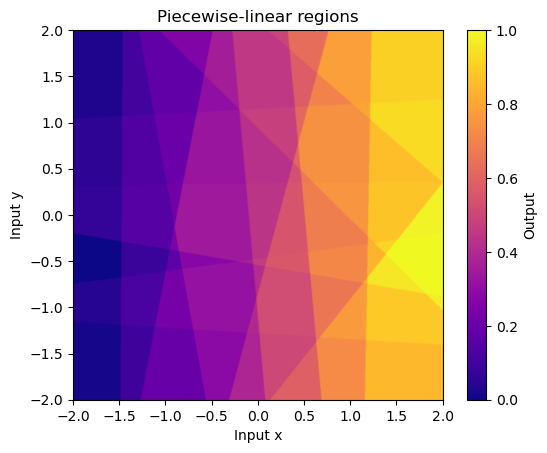

In [6]:
import matplotlib.pyplot as plt
plt.imshow(smooth_colors, extent=(-2, 2, -2, 2), origin='lower', cmap='plasma')
plt.colorbar(label='Output')
plt.xlabel('Input x')
plt.ylabel('Input y')
plt.title('Piecewise-linear regions')
plt.show()

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
# Create a new figure and axis
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the surface with different colors for each piecewise-linear region
ax.plot_surface(x_grid, y_grid, z_grid, facecolors=plt.cm.plasma(smooth_colors))

# Set labels for the x, y, and z axes
ax.set_xlabel('Input x')
ax.set_ylabel('Input y')
ax.set_zlabel('Output z')
# change view angle
ax.view_init(90, 0)
# Show the plot
plt.show()


## Score Network training

In [7]:
%load_ext autoreload
%autoreload 2

In [ ]:
import sys
sys.path.append('..')

In [13]:
from sklearn.model_selection import train_test_split
from core.NN_score_approximator_lib import ScoreModel_Time_edm, train_score_td, generate_ring_samples_torch
from core.NN_score_approximator_lib import visualize_diffusion_distr, reverse_diffusion_time_dep

In [195]:
def compute_gradients(input_pnts, output_pnts,):
    ndim = input_pnts.shape[-1]
    jacobians = []
    for i in range(ndim):
        output_pnts[:, i].backward(torch.ones_like(output_pnts[:, i]), retain_graph=True)
        gradients = input_pnts.grad.detach().clone()
        input_pnts.grad.zero_()
        jacobians.append(gradients)
    return torch.stack(jacobians, dim=-2).cpu() # shape (n, ndim[out], ndim[in])


def unique_color_region(jacobian_grid):
    # jacobian_grid shape (nrow, ncol, ndim[out], ndim[in])
    nrow, ncol = jacobian_grid.shape[:2]
    jacobian_mat = jacobian_grid.view(nrow * ncol, -1)
    # Find the unique gradient values and assign a color to each unique value
    unique_grads, unique_indices = np.unique(jacobian_mat, axis=0, return_inverse=True)
    # colors = np.array([np.arange(len(unique_grads)),] * len(gradients_mat)).flatten()[unique_indices]
    colors = unique_indices
    colors_grid = colors.reshape((nrow, ncol))
    return colors, colors_grid, unique_grads


def plot_linear_region(input_grid, output_grid, jacobian_grid, 
                       extent=None, origin="lower", cmap="plasma",
                       subsp_factor=20,):
    if extent is None:
        extent = (input_grid.min(), input_grid.max(), input_grid.min(), input_grid.max())
    x_grid = input_grid[..., 0]
    y_grid = input_grid[..., 1]
    colors, colors_grid, uniq_grads = unique_color_region(jacobian_grid)
    # # Normalize the colors to [0, 1] range
    normalized_colors = (colors_grid - colors_grid.min()) / (colors_grid.max() - colors_grid.min())
    # # Apply Gaussian blur to smooth the edges between regions
    # smooth_colors = gaussian_filter(normalized_colors, sigma=1)
    # Random look up table for color
    color_LUT = np.random.rand(len(uniq_grads), 3)
    rnd_colors = color_LUT[colors, :]
    rnd_color_grid = rnd_colors.reshape(x_grid.shape + (3,))
    figh, axs = plt.subplots(1,2,figsize=(10, 5))
    plt.subplot(1, 2, 1)
    slc = slice(None, None, subsp_factor)
    input_slc = input_grid[slc, slc].detach().numpy()
    output_slc = output_grid[slc, slc].detach().numpy()
    plt.quiver(input_slc[:, :, 0].flatten(), input_slc[:, :, 1].flatten(), 
               output_slc[:, :, 0].flatten(), output_slc[:, :, 1].flatten())
    plt.axis("image")
    plt.subplot(1, 2, 2)
    plt.pcolormesh(x_grid, y_grid, normalized_colors, cmap=cmap)
    plt.axis("image")
    # plt.imshow(normalized_colors, extent=extent, origin=origin, cmap=cmap)
    plt.colorbar(label='Output')
    plt.xlabel('Input x')
    plt.ylabel('Input y')
    plt.title(f'Piecewise-linear regions\n {len(uniq_grads)} unique regions')
    return figh, axs
    

In [202]:
!ls $WORK_DIR/DL_Projects/
!mkdir $WORK_DIR/DL_Projects/ScoreNetworkDissection

DiffusionHiddenLinear


In [203]:
!cd $WORK_DIR/DL_Projects/ScoreNetworkDissection; pwd

/n/holylabs/LABS/kempner_fellows/Users/binxuwang/DL_Projects/ScoreNetworkDissection


In [204]:
from os.path import join
from core.utils.plot_utils import saveallforms
figroot = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/DL_Projects/ScoreNetworkDissection"
figdir = join(figroot, "score_network_linear_regions")

### Ring manifold model

In [12]:
# train_score_td
# figdir = r"/Users/binxuwang/Library/CloudStorage/OneDrive-HarvardUniversity/HaimDiffusionRNNProj/Ring_NN_train"
ring_X = generate_ring_samples_torch(10000)
# train test split
# Xtrain, Xtest = ring_X, torch.empty(0, 2)  # train_test_split(ring_X, test_size=0.0001, random_state=42)
Xtrain, Xtest = train_test_split(ring_X, test_size=0.1, random_state=42)

sigma_max = 10
mlp_width = 64
mlp_depth = 3 # note, 2 layer usually doesn't work. 3 layer works.
act_fun = nn.ReLU
cfg_str = f"mlp {mlp_depth} layer width{mlp_width} {act_fun.__name__} sigma{sigma_max}"

# for batch_size in [128, 256, 512, 1024]:
#     for epochs in [250, 500, 750, 1000, 1500, 2000,]:
batch_size = 512
epochs = 5000
torch.manual_seed(42)
score_model_td = ScoreModel_Time_edm(sigma=sigma_max, ndim=2, act_fun=act_fun, 
                                    nhidden=mlp_width, nlayers=mlp_depth,
                                    time_embed_dim=32)
score_model_td = train_score_td(Xtrain, score_model_td=score_model_td,
                sigma=sigma_max, lr=0.005, nepochs=epochs, batch_size=batch_size)

step 105 loss 0.618:   1%|▊                                                                          | 53/5000 [00:00<00:09, 523.80it/s]

step 0 loss 0.713


step 4999 loss 0.495: 100%|████████████████████████████████████████████████████████████████████████| 5000/5000 [00:09<00:00, 520.17it/s]


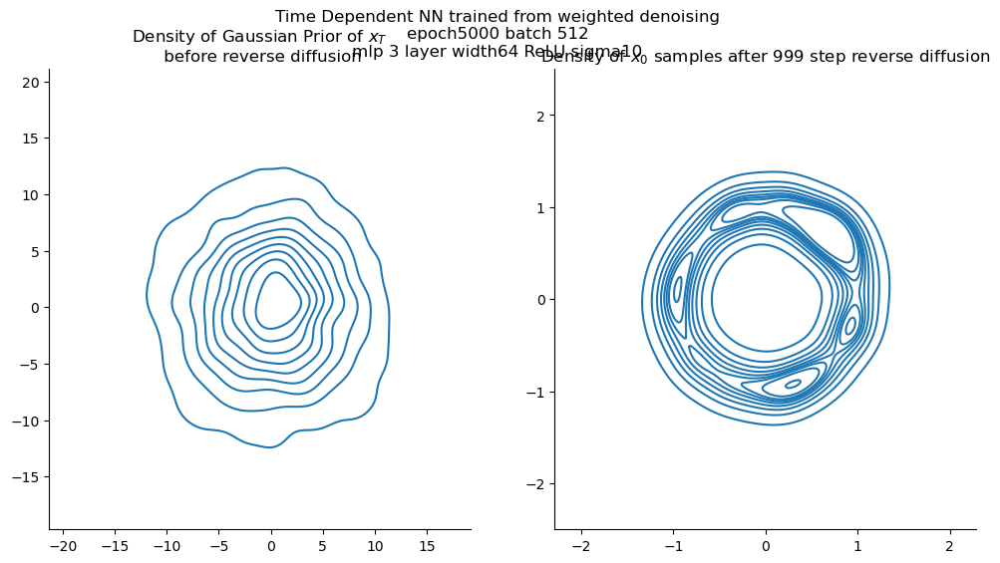

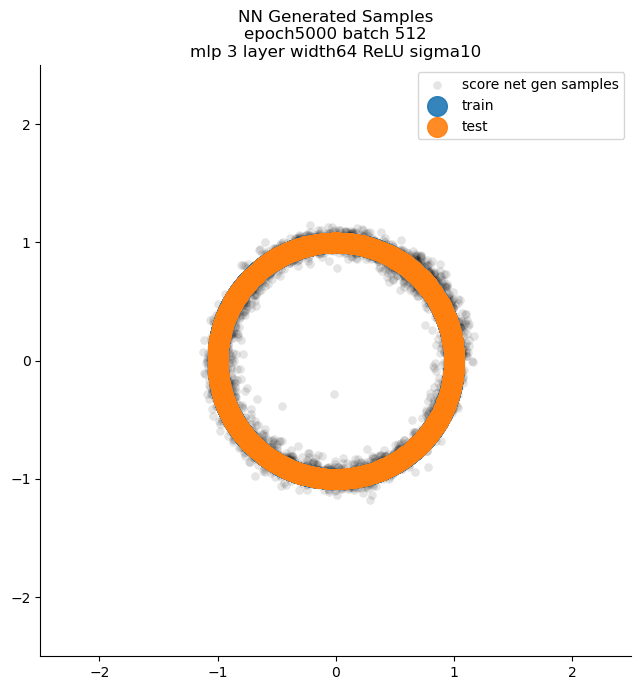

In [14]:
x_traj_denoise = reverse_diffusion_time_dep(score_model_td, sampN=3000, sigma=sigma_max, nsteps=1000, ndim=2, exact=False)
figh = visualize_diffusion_distr(x_traj_denoise,
                        explabel=f"Time Dependent NN trained from weighted denoising\nepoch{epochs} batch {batch_size}\n{cfg_str}")
figh.axes[1].set_xlim([-2.5, 2.5])
figh.axes[1].set_ylim([-2.5, 2.5])
# saveallforms(figdir, f"ring_NN_contour_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
figh.show()
#%%
plt.figure(figsize=(7, 7))
plt.scatter(x_traj_denoise[:, 0, -1], x_traj_denoise[:, 1, -1], alpha=0.1, lw=0.1, color="k", label="score net gen samples")
plt.scatter(Xtrain[:, 0], Xtrain[:, 1], s=200, alpha=0.9, label="train", marker="o")
plt.scatter(Xtest[:, 0], Xtest[:, 1], s=200, alpha=0.9, label="test", marker="o")
plt.axis("image")
plt.xlim(-2.5, 2.5)
plt.ylim(-2.5, 2.5)
plt.title(f"NN Generated Samples\nepoch{epochs} batch {batch_size}\n{cfg_str}")
plt.legend()
plt.tight_layout()
# saveallforms(figdir, f"ring_NN_samples_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
plt.show()

In [15]:
score_model_td

ScoreModel_Time_edm(
  (embed): GaussianFourierProjection()
  (net): Sequential(
    (0): Linear(in_features=34, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): ReLU()
    (4): Linear(in_features=64, out_features=2, bias=True)
  )
)

In [67]:
# Define the grid
sigma = 0.05
resolution = 500
x = torch.linspace(-2.5, 2.5, resolution)
y = torch.linspace(-2.5, 2.5, resolution)
x_grid, y_grid = torch.meshgrid(x, y)
input_grid = torch.stack((x_grid, y_grid), dim=-1)
input_pnts = input_grid.reshape(-1, 2)
sigma_vec = torch.ones(input_pnts.shape[0]) * sigma
# Measure the output from score_model_td

# Measure the gradient with respect to the input
input_pnts.requires_grad_(True)
output_grid = score_model_td(input_pnts, sigma_vec)
output_grid.backward(torch.ones_like(output_grid))
# Get the gradients
gradients = input_pnts.grad
# Reshape the output and gradients to match the grid shape
output_grid = output_grid.reshape(x_grid.shape + (2,))
gradients = gradients.reshape(x_grid.shape + (2,))
# Print the output and gradients
print("Output Grid:")
print(output_grid.shape)
print("Gradients:")
print(gradients.shape)


Output Grid:
torch.Size([500, 500, 2])
Gradients:
torch.Size([500, 500, 2])


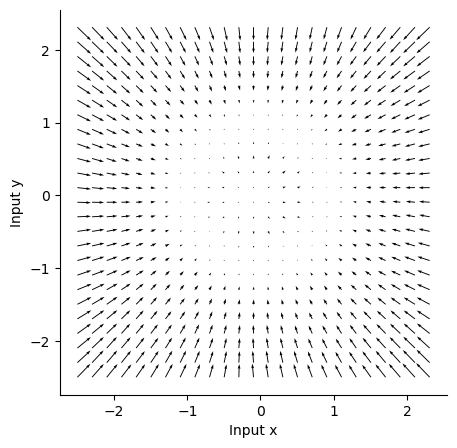

In [72]:
slc = slice(None, None, 20)
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(5, 5))
# Plot the quiver plot
ax.quiver(input_grid[slc, slc, 0].flatten().detach().numpy(), input_grid[slc, slc, 1].flatten().detach().numpy(), 
          output_grid[slc, slc, 0].detach().flatten(), output_grid[slc, slc, 1].detach().flatten())
# Set labels for the x and y axes
ax.set_xlabel('Input x')
ax.set_ylabel('Input y')
# Show the plot
plt.show()


In [70]:

gradients_mat = gradients.view(-1, 2)
# Find the unique gradient values and assign a color to each unique value
unique_grads, unique_indices = np.unique(gradients_mat, axis=0, return_inverse=True)
colors = np.array([np.arange(len(unique_grads)),] * len(grads)).flatten()[unique_indices]
colors_grid = colors.reshape(x_grid.shape)

# # Normalize the colors to [0, 1] range
normalized_colors = (colors_grid - colors_grid.min()) / (colors_grid.max() - colors_grid.min())

# # Apply Gaussian blur to smooth the edges between regions
# smooth_colors = gaussian_filter(normalized_colors, sigma=1)
# random look up table for color
color_LUT = np.random.rand(len(unique_grads), 3)
rnd_colors = color_LUT[unique_indices, :]
rnd_color_grid = rnd_colors.reshape(x_grid.shape + (3,))

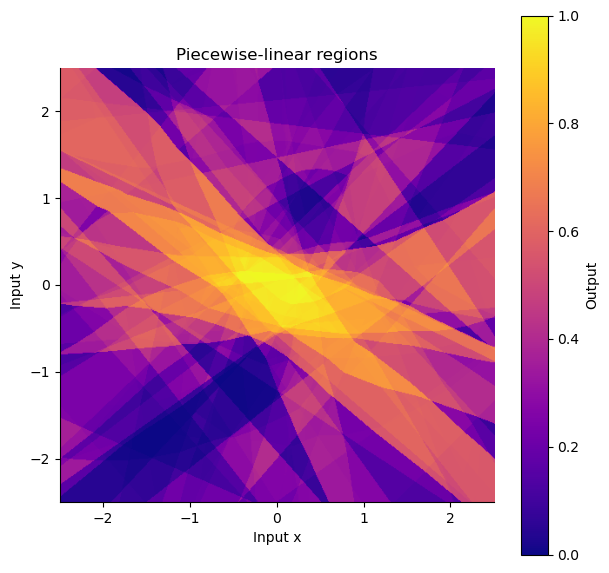

In [57]:
plt.figure(figsize=(7, 7))
plt.imshow(normalized_colors, extent=(-2.5, 2.5, -2.5, 2.5), origin='lower', cmap='plasma')
plt.colorbar(label='Output')
plt.xlabel('Input x')
plt.ylabel('Input y')
plt.title('Piecewise-linear regions')
plt.show()

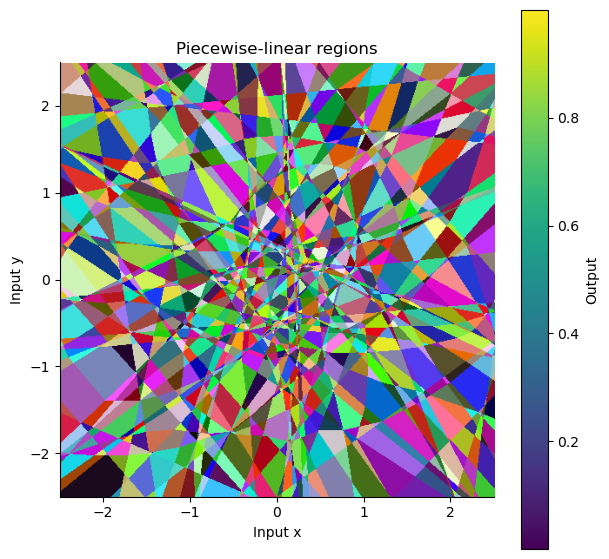

In [66]:
plt.figure(figsize=(7, 7))
plt.imshow(rnd_color_grid, extent=(-2.5, 2.5, -2.5, 2.5), origin='lower', )
plt.colorbar(label='Output')
plt.xlabel('Input x')
plt.ylabel('Input y')
plt.title('Piecewise-linear regions')
plt.show()

In [106]:
theta = np.linspace(0, 2*np.pi, 100)
r = 1
x1 = r * np.cos(theta)
x2 = r * np.sin(theta)

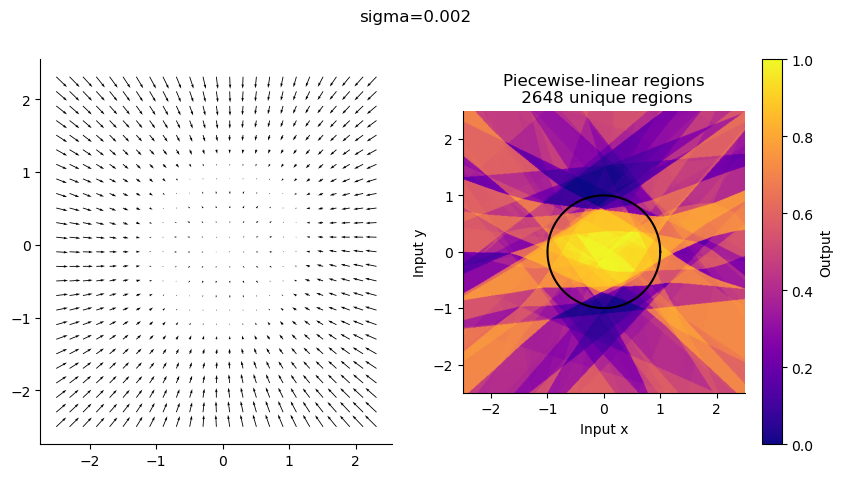

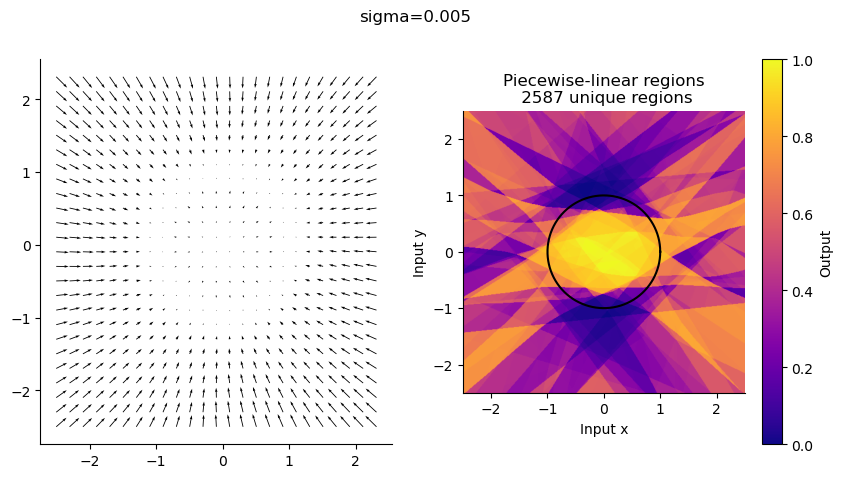

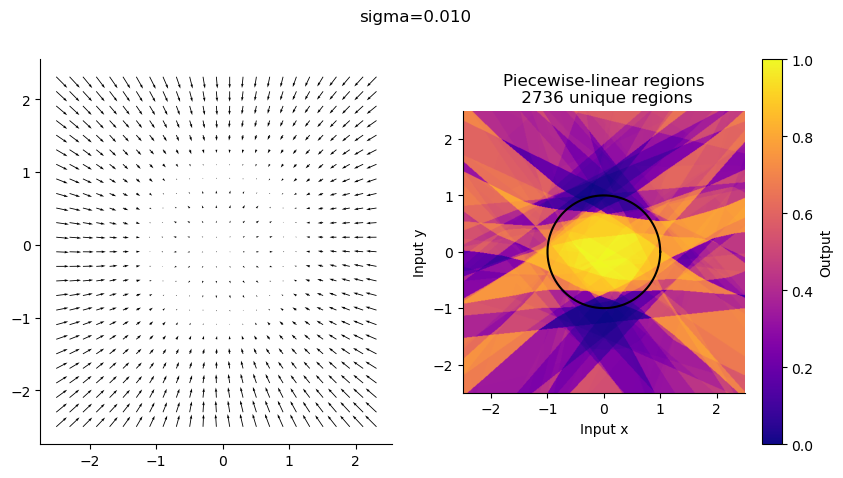

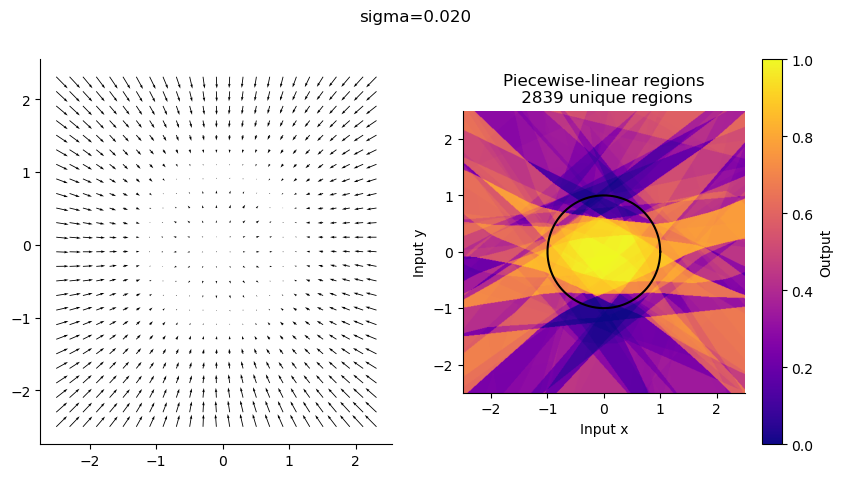

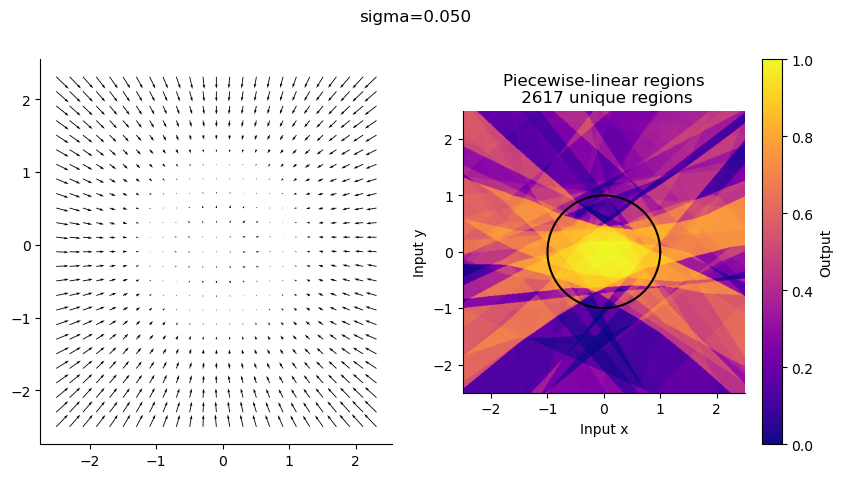

...

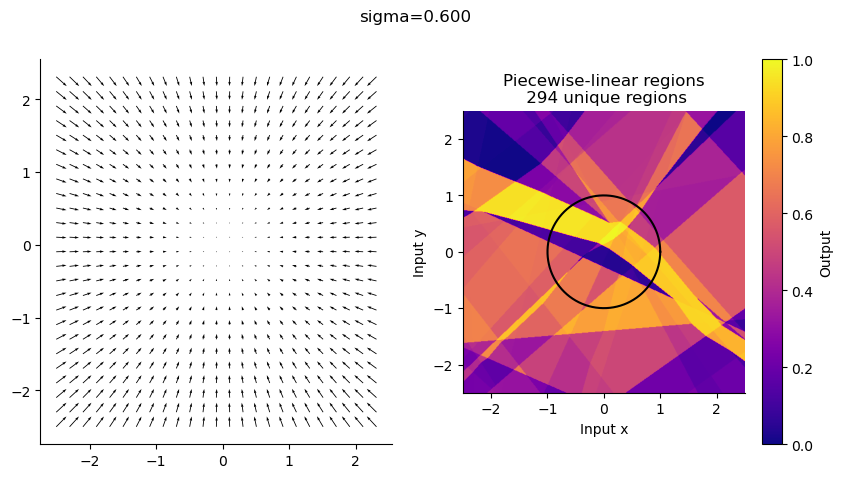

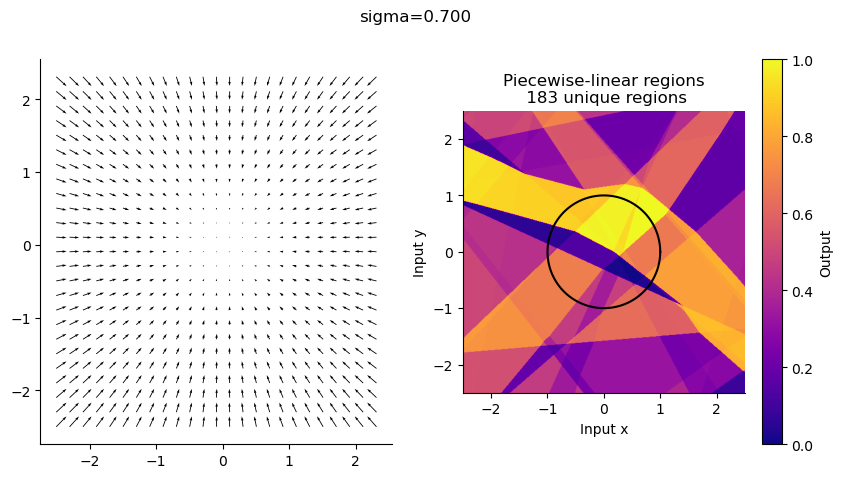

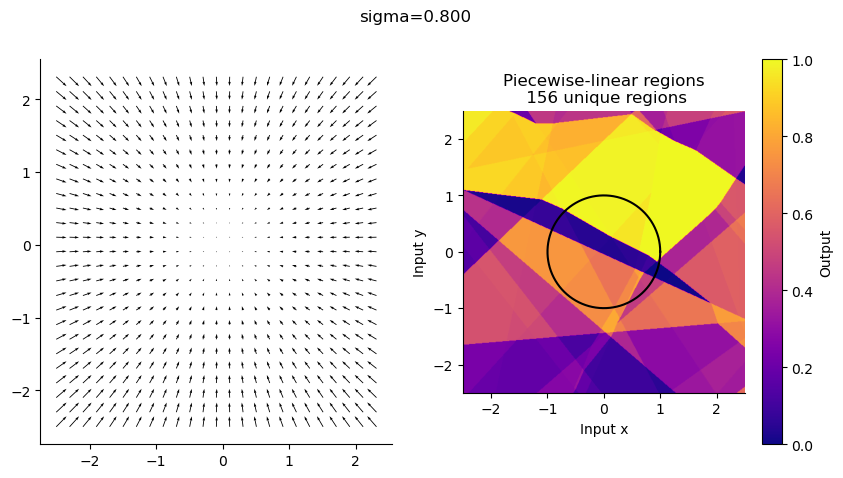

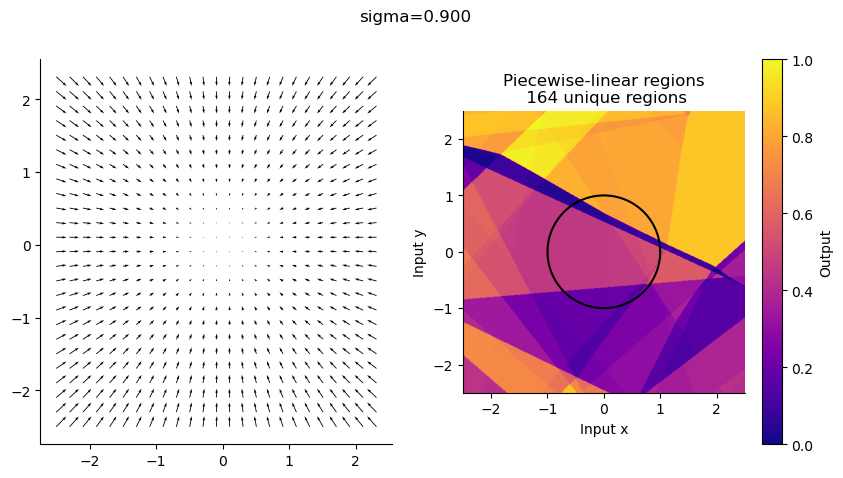

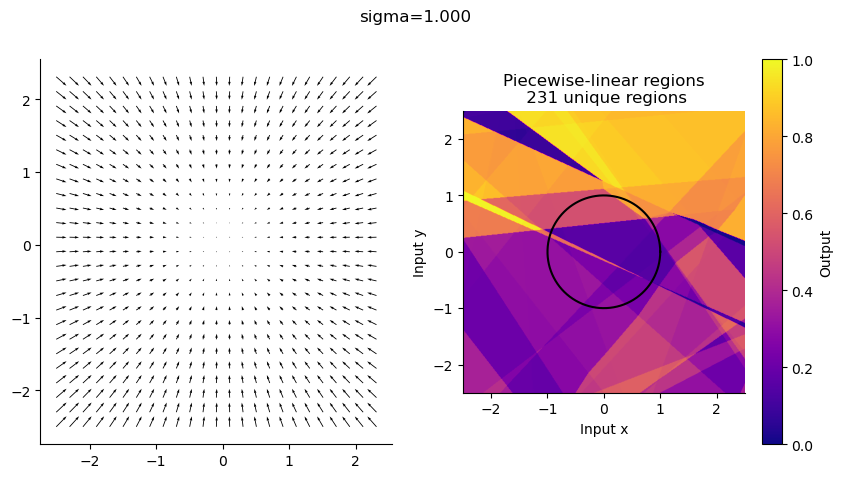

In [109]:
device = "cuda"
score_model_td = score_model_td.to(device).eval()
# Define the grid
sigma = 0.05
resolution = 500
x = torch.linspace(-2.5, 2.5, resolution)
y = torch.linspace(-2.5, 2.5, resolution)
x_grid, y_grid = torch.meshgrid(x, y)
input_grid = torch.stack((x_grid, y_grid), dim=-1)
input_pnts = input_grid.reshape(-1, 2).to(device)
input_pnts.requires_grad_(True)
ndim = input_pnts.shape[-1]
for sigma in [0.002, 0.005, 0.01, 0.02, 0.05, *np.linspace(0.1, 1, 10)]:
    sigma_vec = torch.ones(input_pnts.shape[0]).to(device) * sigma
    # Measure the output from score_model_td
    output_pnts = score_model_td(input_pnts, sigma_vec)
    # Measure the gradient with respect to the input
    jacobians = compute_gradients(input_pnts, output_pnts)
    jacobian_grid = jacobians.reshape(x_grid.shape + (ndim * ndim,))
    output_grid = output_pnts.detach().cpu().reshape(x_grid.shape + (ndim,))
    figh, axs = plot_linear_region(input_grid, output_grid, jacobian_grid,
                cmap="plasma", subsp_factor=20)
    axs[-1].plot(x1, x2, color="k")
    figh.suptitle(f"sigma={sigma:.3f}")
    figh.show()

In [81]:
jacobian_mat = jacobian_grid.view(-1, ndim * ndim)
# Find the unique gradient values and assign a color to each unique value
unique_jacs, unique_jac_indices = np.unique(jacobian_mat, axis=0, return_inverse=True)
colors = np.array([np.arange(len(unique_jacs)),] * len(jacobian_mat)).flatten()[unique_jac_indices]
colors_grid = colors.reshape(x_grid.shape)
# # Normalize the colors to [0, 1] range
normalized_colors = (colors_grid - colors_grid.min()) / (colors_grid.max() - colors_grid.min())
# # Apply Gaussian blur to smooth the edges between regions
# smooth_colors = gaussian_filter(normalized_colors, sigma=1)
# random look up table for color
color_LUT = np.random.rand(len(unique_grads), 3)
rnd_colors = color_LUT[unique_indices, :]
rnd_color_grid = rnd_colors.reshape(x_grid.shape + (3,))

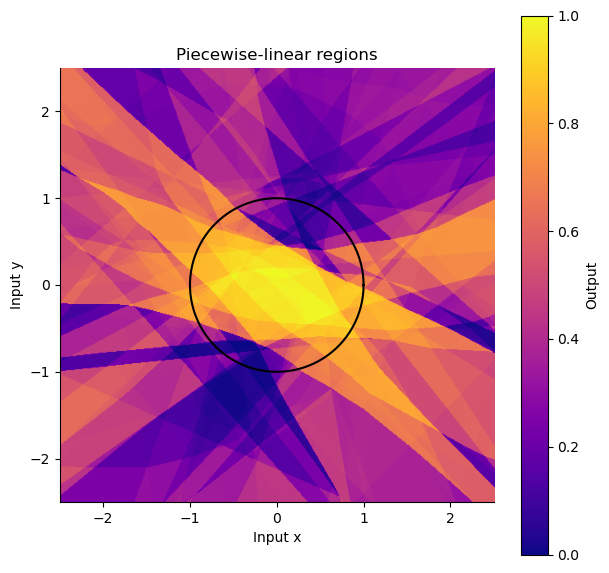

In [86]:
plt.figure(figsize=(7, 7))
plt.imshow(normalized_colors, extent=(-2.5, 2.5, -2.5, 2.5), origin='lower', cmap='plasma')

theta = np.linspace(0, 2*np.pi, 100)
r = 1
x1 = r * np.cos(theta)
x2 = r * np.sin(theta)
plt.plot(x1, x2, color="k")
plt.colorbar(label='Output')
plt.xlabel('Input x')
plt.ylabel('Input y')
plt.title('Piecewise-linear regions')
plt.show()

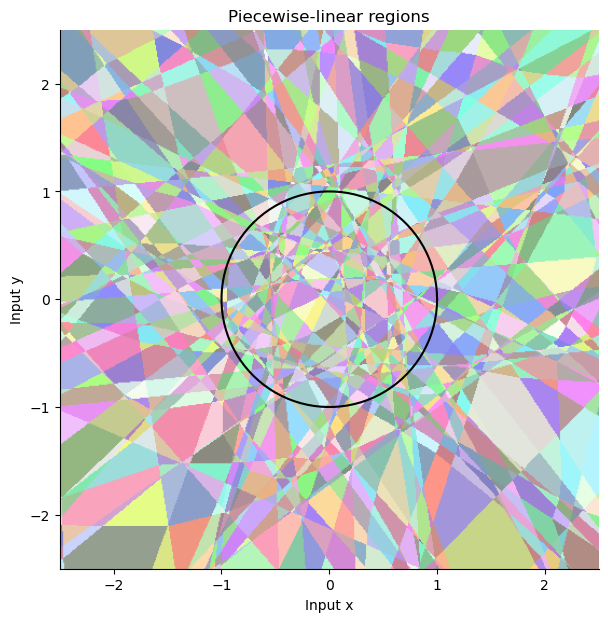

In [85]:
plt.figure(figsize=(7, 7))
plt.imshow(rnd_color_grid, extent=(-2.5, 2.5, -2.5, 2.5), 
           origin='lower', cmap='plasma', alpha=0.5)
# draw the circle
theta = np.linspace(0, 2*np.pi, 100)
r = 1
x1 = r * np.cos(theta)
x2 = r * np.sin(theta)
plt.plot(x1, x2, color="k")
# plt.colorbar(label='Output')
plt.xlabel('Input x')
plt.ylabel('Input y')
plt.title('Piecewise-linear regions')
plt.show()

### Mixture model

In [110]:
from core.gmm_general_diffusion_lib import gaussian_mixture_logprob_score_torch
from core.gaussian_mixture_lib import GaussianMixture_torch

In [136]:
mus = torch.tensor([[2, -2], 
                [1, 3],
                [-3, 2],], dtype=torch.float32)
sigmas = torch.tensor([[[1, .5], [.5, 1]], 
                   [[.9, -.4], [-.4, 2]],
                   [[1, 0], [0, .3]]], dtype=torch.float32)
pis = torch.tensor([0.3, 0.3, 0.3], dtype=torch.float32)
gmm = GaussianMixture_torch(mus, sigmas, pis)
samples, _, _ = gmm.sample(10000)

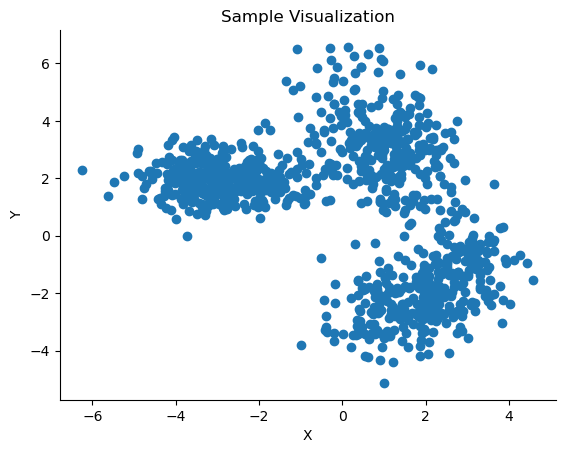

In [135]:
import matplotlib.pyplot as plt

plt.scatter(samples[:, 0], samples[:, 1])
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Sample Visualization')
plt.show()


In [177]:
# train_score_td
# figdir = r"/Users/binxuwang/Library/CloudStorage/OneDrive-HarvardUniversity/HaimDiffusionRNNProj/Ring_NN_train"
gmm_X, _, _ = gmm.sample(10000)
# train test split
# Xtrain, Xtest = ring_X, torch.empty(0, 2)  # train_test_split(ring_X, test_size=0.0001, random_state=42)
Xtrain, Xtest = train_test_split(gmm_X, test_size=0.1, random_state=42)
device = "cuda"
sigma_max = 25
mlp_width = 64
mlp_depth = 3 # note, 2 layer usually doesn't work. 3 layer works.
act_fun = nn.ReLU
batch_size = 512
epochs = 50000
cfg_str = f"mlp {mlp_depth} layer width{mlp_width} {act_fun.__name__} sigma{sigma_max}\nbatch{batch_size} ep{epochs}"
torch.manual_seed(42)
score_model_gmm = ScoreModel_Time_edm(sigma=sigma_max, ndim=2, act_fun=act_fun, 
                                    nhidden=mlp_width, nlayers=mlp_depth,
                                    time_embed_dim=32)
score_model_gmm.to(device)
score_model_gmm = train_score_td(Xtrain.to(device), score_model_td=score_model_gmm,
                sigma=sigma_max, lr=0.005, nepochs=epochs, batch_size=batch_size)

step 114 loss 1.028:   0%|▏                                                                        | 115/50000 [00:00<01:27, 570.02it/s]

step 0 loss 1.843


step 49999 loss 0.912: 100%|█████████████████████████████████████████████████████████████████████| 50000/50000 [01:27<00:00, 573.69it/s]


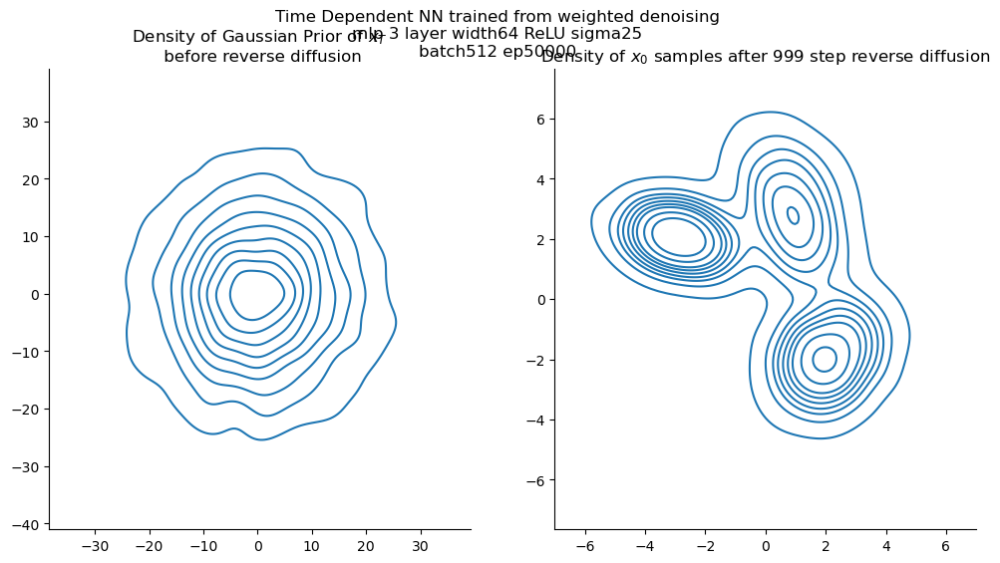

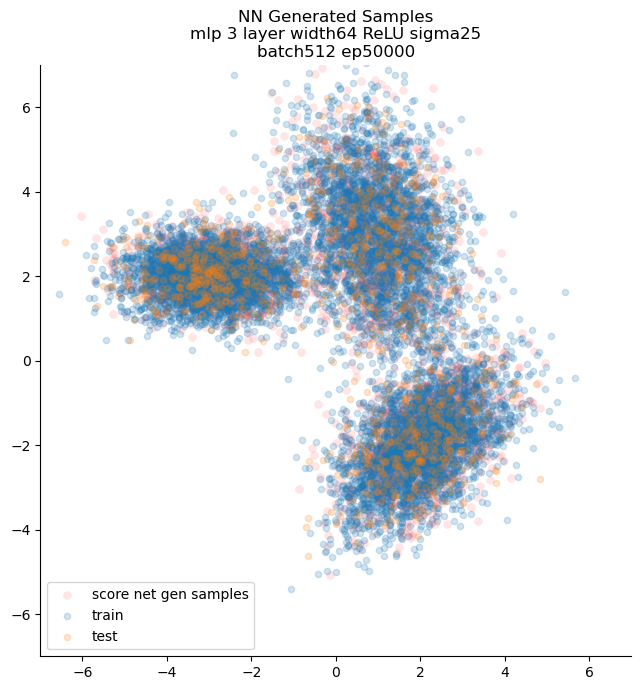

In [178]:
xlim, ylim = (-7, 7), (-7, 7)
x_traj_denoise = reverse_diffusion_time_dep(score_model_gmm, sampN=3000, sigma=sigma_max, nsteps=1000, ndim=2, exact=False, device=device)
figh = visualize_diffusion_distr(x_traj_denoise,
                        explabel=f"Time Dependent NN trained from weighted denoising\n{cfg_str}")
figh.axes[1].set_xlim(xlim)
figh.axes[1].set_ylim(ylim)
# saveallforms(figdir, f"ring_NN_contour_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
figh.show()
#%%
plt.figure(figsize=(7, 7))
plt.scatter(x_traj_denoise[:, 0, -1], x_traj_denoise[:, 1, -1], alpha=0.1, lw=0.1, color="r", label="score net gen samples")
plt.scatter(Xtrain[:, 0], Xtrain[:, 1], s=20, alpha=0.2, label="train", marker="o")
plt.scatter(Xtest[:, 0], Xtest[:, 1], s=20, alpha=0.2, label="test", marker="o")
plt.axis("image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.title(f"NN Generated Samples\n{cfg_str}")
plt.legend()
plt.tight_layout()
# saveallforms(figdir, f"ring_NN_samples_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
plt.show()

/n/home12/binxuwang/Github/DiffusionMemorization/notebooks/../core/gaussian_mixture_lib.py:125: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.weights = torch.tensor(weights)


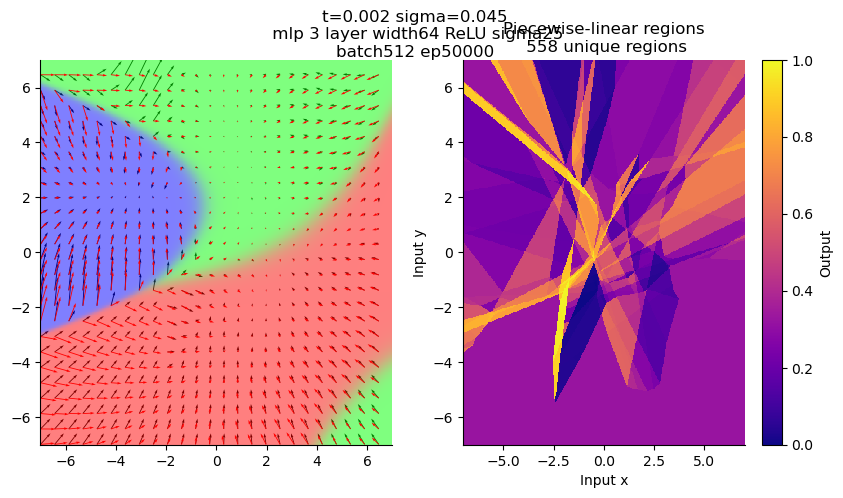

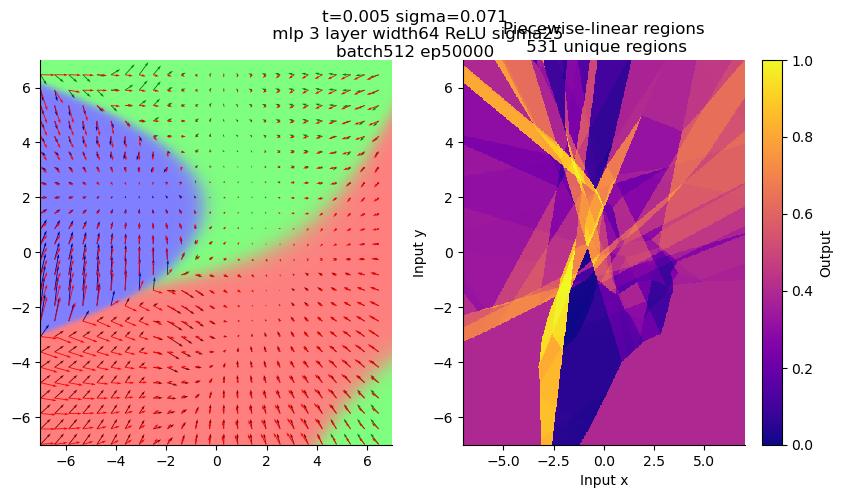

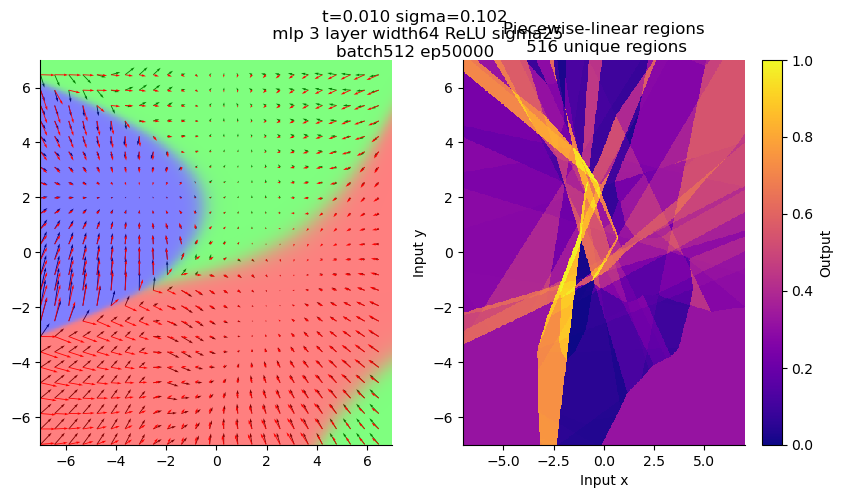

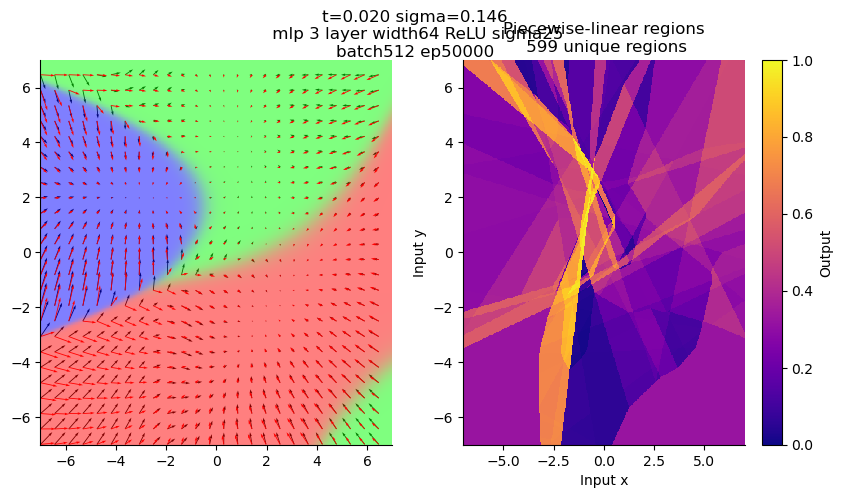

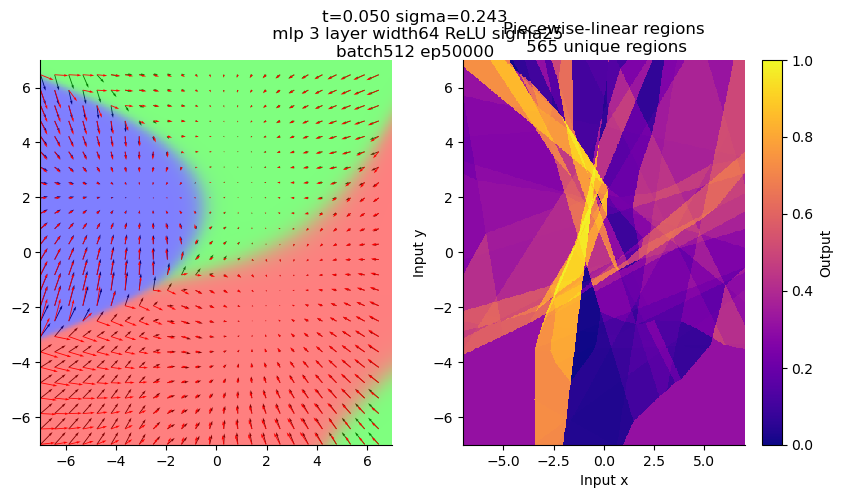

...

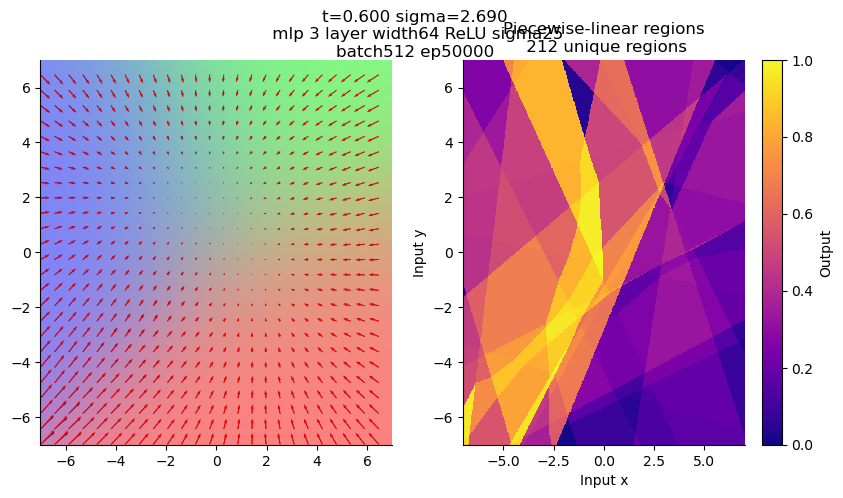

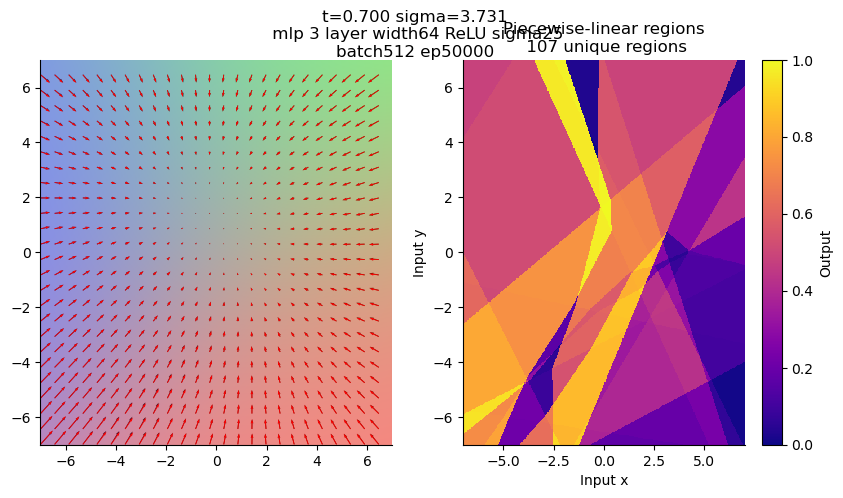

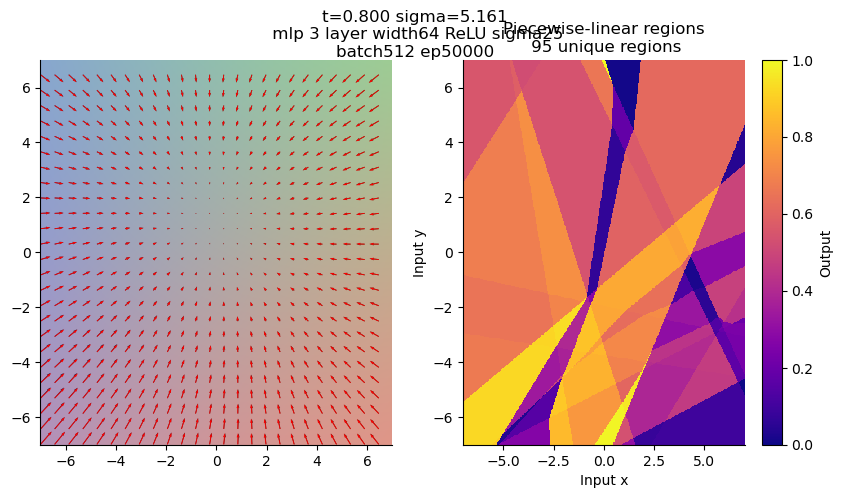

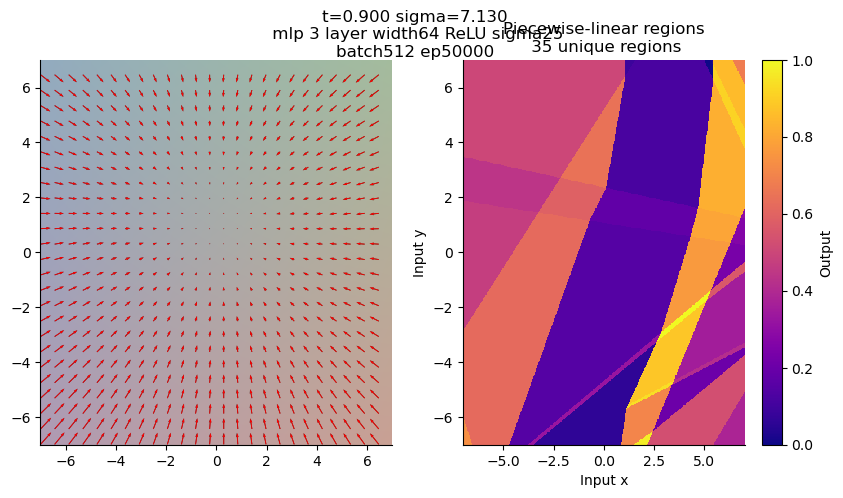

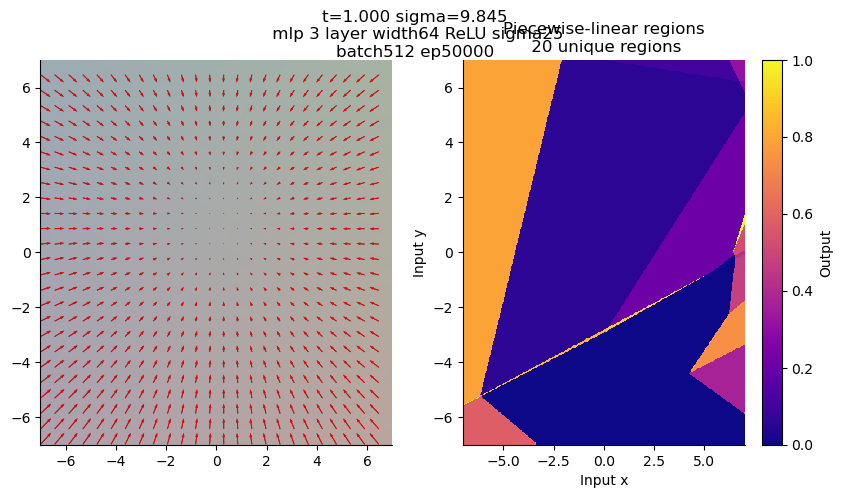

In [179]:
from core.gaussian_mixture_lib import diffuse_gmm_torch

device = "cuda"
score_model_gmm = score_model_gmm.to(device).eval()
# Define the grid
resolution = 500
xlim, ylim = (-7, 7), (-7, 7)
x = torch.linspace(*xlim, resolution)
y = torch.linspace(*ylim, resolution)
x_grid, y_grid = torch.meshgrid(x, y)
input_grid = torch.stack((x_grid, y_grid), dim=-1)
input_pnts = input_grid.reshape(-1, 2).to(device)
input_pnts.requires_grad_(True)
ndim = input_pnts.shape[-1]
for time in [0.002, 0.005, 0.01, 0.02, 0.05, *np.linspace(0.1, 1, 10)]:
    sigma = score_model_gmm.marginal_prob_std_f(time)
    gmm_sigma = diffuse_gmm_torch(gmm, time, sigma=sigma_max)
    _, weight_part = gmm_sigma.score_decompose(input_pnts.detach().cpu())
    gmm_score_gt = gmm_sigma.score(input_pnts.detach().cpu())
    gmm_score_gt = gmm_score_gt.reshape(x_grid.shape + (ndim,))
    weight_part_map = weight_part.reshape(resolution, resolution, gmm.n_component)
    sigma_vec = torch.ones(input_pnts.shape[0]).to(device) * time
    # Measure the output from score_model_td
    output_pnts = score_model_gmm(input_pnts, sigma_vec)
    # Measure the gradient with respect to the input
    jacobians = compute_gradients(input_pnts, output_pnts)
    jacobian_grid = jacobians.reshape(x_grid.shape + (ndim * ndim,))
    output_grid = output_pnts.detach().cpu().reshape(x_grid.shape + (ndim,))
    figh, axs = plot_linear_region(input_grid, output_grid, jacobian_grid,
                cmap="plasma", subsp_factor=20)
    # axs[-1].plot(x1, x2, color="k")
    # axs[0].imshow(weight_part_map[:, :,], extent=(*xlim, *ylim), origin='upper', alpha=0.5)
    axs[0].pcolormesh(x_grid, y_grid, weight_part_map[:, :,], alpha=0.5) # extent=(*xlim, *ylim), origin='upper', 
    axs[0].quiver(input_grid[::20, ::20, 0].flatten(), input_grid[::20, ::20, 1].flatten(),
                gmm_score_gt[::20, ::20, 0].flatten(), gmm_score_gt[::20, ::20, 1].flatten(), color="r")
    figh.suptitle(f"t={time:.3f} sigma={sigma:.3f}\n {cfg_str}")

### Much Deeper network for GMM 

In [207]:
import os
import json
expdir = join(figdir, "GMM_deep_EP200k")
os.makedirs(expdir, exist_ok=True)

In [180]:
# train_score_td
# figdir = r"/Users/binxuwang/Library/CloudStorage/OneDrive-HarvardUniversity/HaimDiffusionRNNProj/Ring_NN_train"
gmm_X, _, _ = gmm.sample(10000)
# train test split
# Xtrain, Xtest = ring_X, torch.empty(0, 2)  # train_test_split(ring_X, test_size=0.0001, random_state=42)
Xtrain, Xtest = train_test_split(gmm_X, test_size=0.1, random_state=42)
device = "cuda"
sigma_max = 25
mlp_width = 256
mlp_depth = 5 # note, 2 layer usually doesn't work. 3 layer works.
act_fun = nn.ReLU
time_embed_dim = 32
lr = 0.005
batch_size = 2048
epochs = 200000
cfg_str = f"mlp {mlp_depth} layer width{mlp_width} {act_fun.__name__} sigma{sigma_max}\nbatch{batch_size} ep{epochs}"
cfg = {"mlp_width": mlp_width, "mlp_depth": mlp_depth, "act_fun": act_fun, "sigma_max": sigma_max, "batch_size": batch_size, "epochs": epochs,
       "time_embed_dim": time_embed_dim, "lr": lr, "cfg_str": cfg_str, }
json.dump(cfg, open(join(expdir, "config.json"), "w"))
torch.manual_seed(42)
score_model_gmm_d = ScoreModel_Time_edm(sigma=sigma_max, ndim=2, act_fun=act_fun, 
                                    nhidden=mlp_width, nlayers=mlp_depth,
                                    time_embed_dim=time_embed_dim)
score_model_gmm_d.to(device)
score_model_gmm_d = train_score_td(Xtrain.to(device), score_model_td=score_model_gmm_d,
                sigma=sigma_max, lr=lr, nepochs=epochs, batch_size=batch_size)

step 96 loss 0.966:   0%|                                                                          | 48/200000 [00:00<07:03, 471.84it/s]

step 0 loss 1.821


step 199999 loss 0.947: 100%|██████████████████████████████████████████████████████████████████| 200000/200000 [06:58<00:00, 477.54it/s]


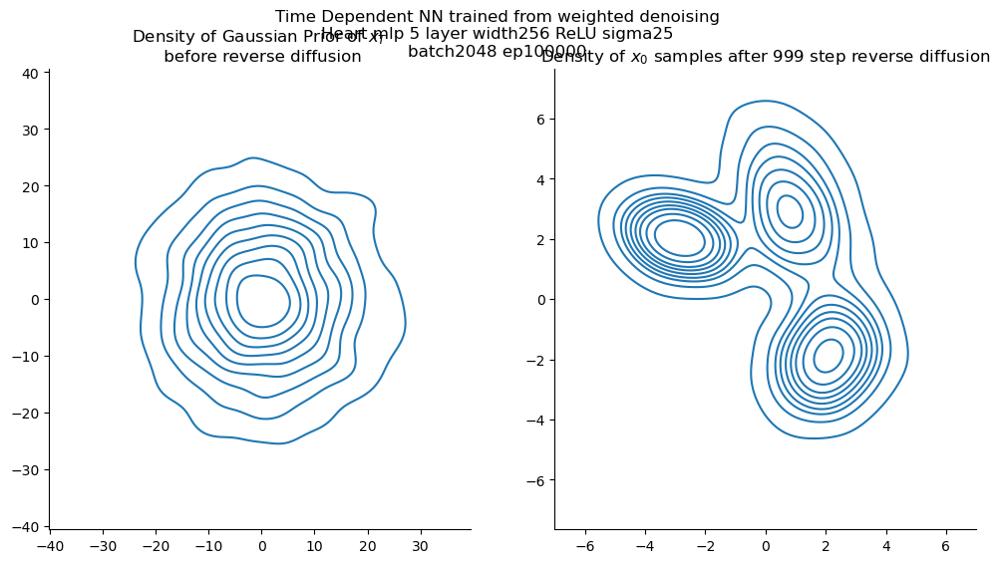

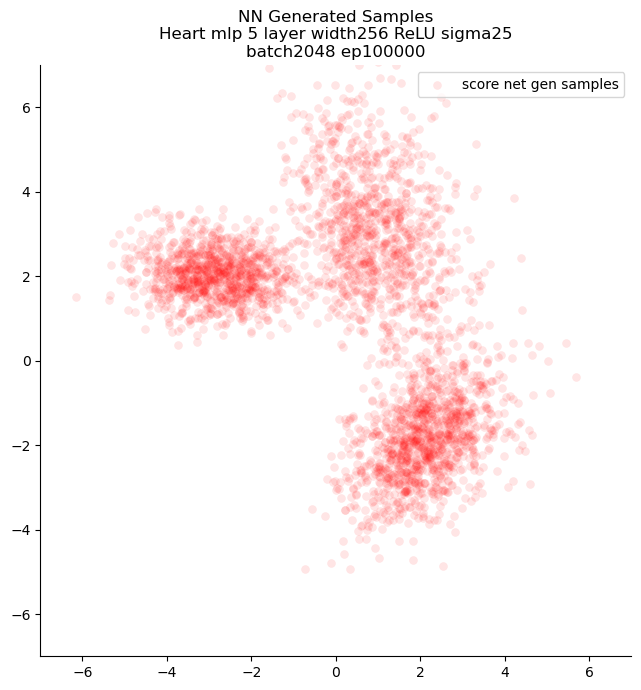

In [205]:
x_traj_denoise = reverse_diffusion_time_dep(score_model_gmm, sampN=3000, sigma=sigma_max, nsteps=1000, ndim=2, exact=False, device=device)
figh = visualize_diffusion_distr(x_traj_denoise,
                        explabel=f"Time Dependent NN trained from weighted denoising\n{cfg_str}")
figh.axes[1].set_xlim([-7,7])
figh.axes[1].set_ylim([-7,7])
# saveallforms(figdir, f"ring_NN_contour_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
figh.show()
#%%
plt.figure(figsize=(7, 7))
plt.scatter(x_traj_denoise[:, 0, -1], x_traj_denoise[:, 1, -1], alpha=0.1, lw=0.1, color="r", label="score net gen samples")
# plt.scatter(Xtrain[:, 0], Xtrain[:, 1], s=20, alpha=0.2, label="train", marker="o")
# plt.scatter(Xtest[:, 0], Xtest[:, 1], s=20, alpha=0.2, label="test", marker="o")
plt.axis("image")
plt.xlim([-7,7])
plt.ylim([-7,7])
plt.title(f"NN Generated Samples\n{cfg_str}")
plt.legend()
plt.tight_layout()
# saveallforms(figdir, f"ring_NN_samples_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
plt.show()

In [208]:
from core.gaussian_mixture_lib import diffuse_gmm_torch

device = "cuda"
score_model_gmm = score_model_gmm.to(device).eval()
# Define the grid
resolution = 500
xlim, ylim = (-7, 7), (-7, 7)
x = torch.linspace(*xlim, resolution)
y = torch.linspace(*ylim, resolution)
x_grid, y_grid = torch.meshgrid(x, y)
input_grid = torch.stack((x_grid, y_grid), dim=-1)
input_pnts = input_grid.reshape(-1, 2).to(device)
input_pnts.requires_grad_(True)
ndim = input_pnts.shape[-1]
for time in [0.002, 0.005, 0.01, 0.02, 0.05, *np.linspace(0.075, 1, 30)]:
    sigma = score_model_gmm.marginal_prob_std_f(time)
    gmm_sigma = diffuse_gmm_torch(gmm, time, sigma=sigma_max)
    _, weight_part = gmm_sigma.score_decompose(input_pnts.detach().cpu())
    gmm_score_gt = gmm_sigma.score(input_pnts.detach().cpu())
    gmm_score_gt = gmm_score_gt.reshape(x_grid.shape + (ndim,))
    weight_part_map = weight_part.reshape(resolution, resolution, gmm.n_component)
    sigma_vec = torch.ones(input_pnts.shape[0]).to(device) * time
    # Measure the output from score_model_td
    output_pnts = score_model_gmm(input_pnts, sigma_vec)
    # Measure the gradient with respect to the input
    jacobians = compute_gradients(input_pnts, output_pnts)
    jacobian_grid = jacobians.reshape(x_grid.shape + (ndim * ndim,))
    output_grid = output_pnts.detach().cpu().reshape(x_grid.shape + (ndim,))
    figh, axs = plot_linear_region(input_grid, output_grid, jacobian_grid,
                cmap="plasma", subsp_factor=20)
    # axs[-1].plot(x1, x2, color="k")
    axs[0].pcolormesh(x_grid, y_grid, weight_part_map[:, :,], alpha=0.5) # extent=(*xlim, *ylim), origin='upper', 
    axs[0].quiver(input_grid[::20, ::20, 0].flatten(), input_grid[::20, ::20, 1].flatten(),
                    gmm_score_gt[::20, ::20, 0].flatten(), gmm_score_gt[::20, ::20, 1].flatten(), color="r")
    figh.suptitle(f"t={time:.3f} sigma={sigma:.3f}\n {cfg_str}")
    saveallforms(expdir, f"score_field_linregion_sigma{sigma:.3f}")
    figh.show()
    plt.close(figh)

/n/home12/binxuwang/Github/DiffusionMemorization/notebooks/../core/gaussian_mixture_lib.py:125: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.weights = torch.tensor(weights)


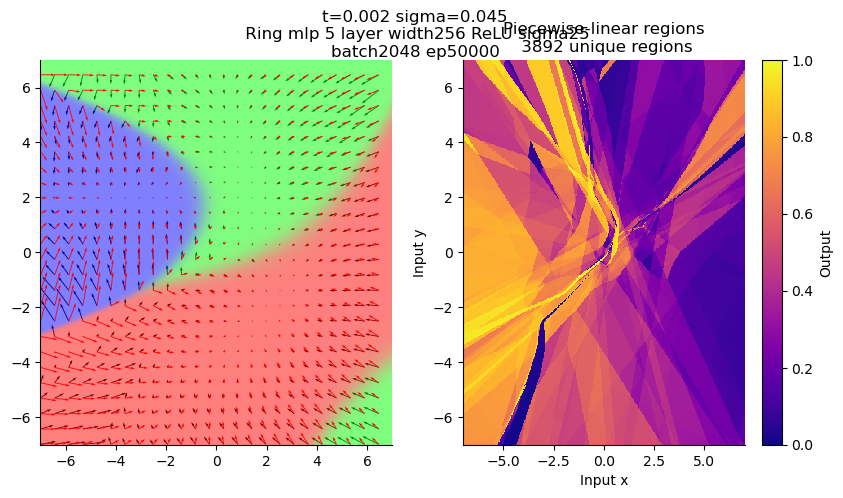

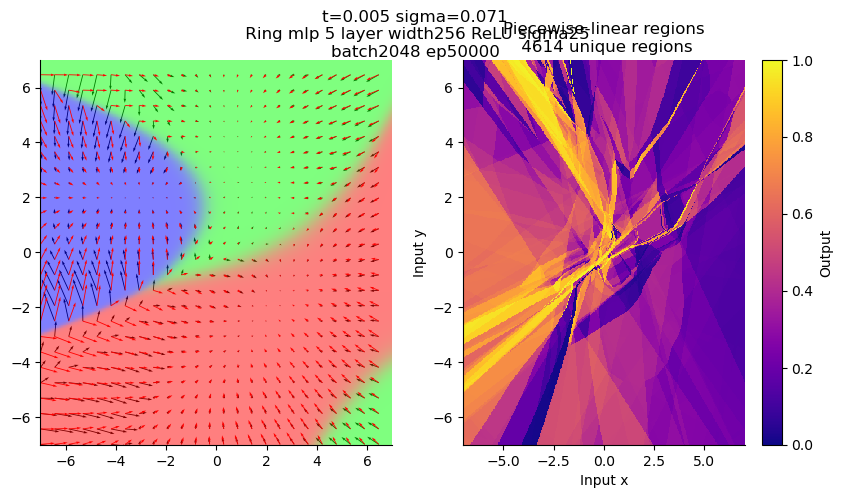

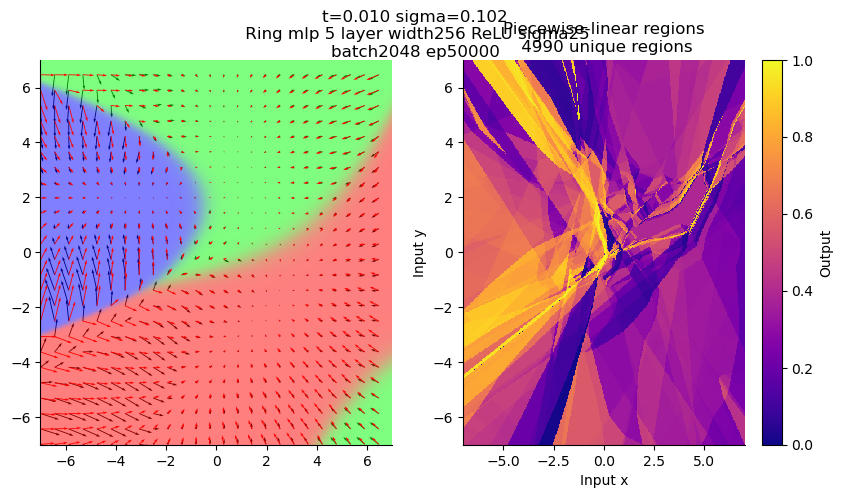

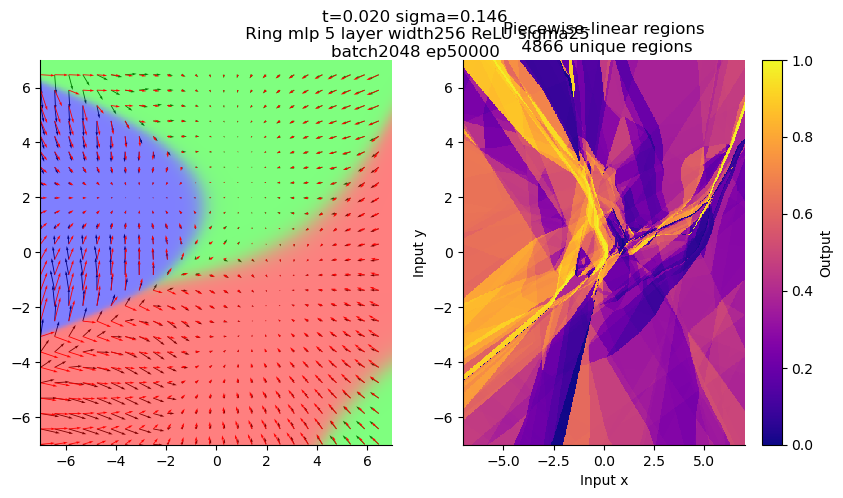

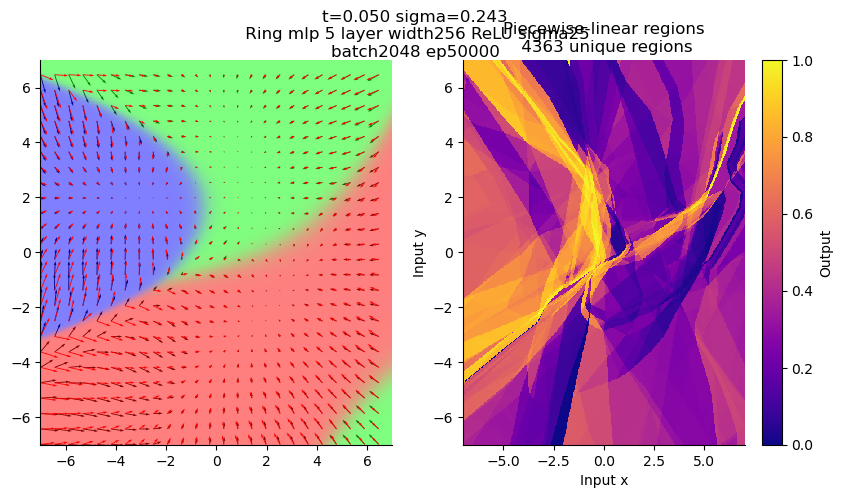

...

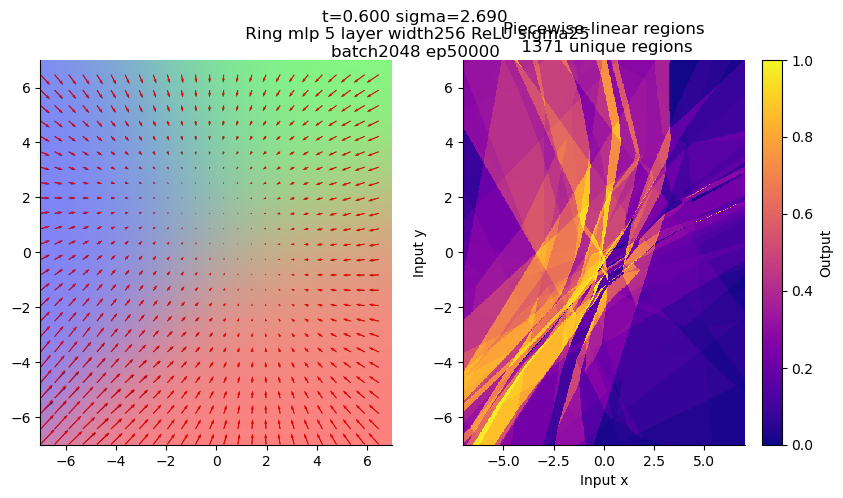

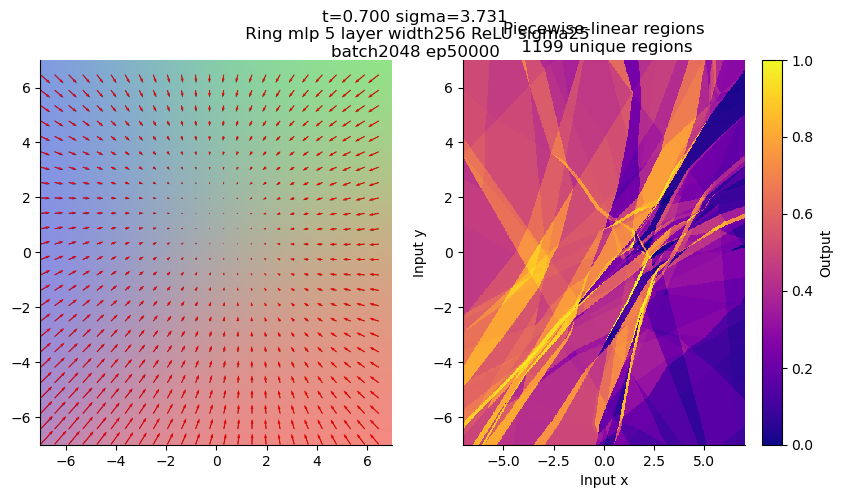

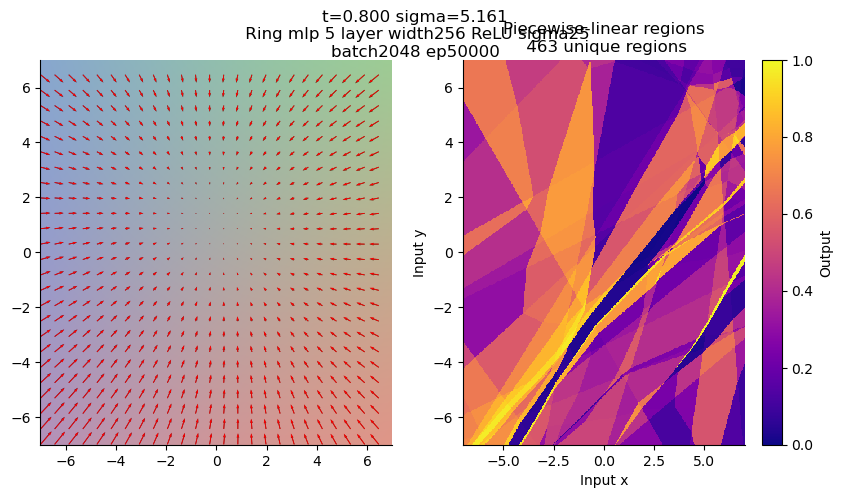

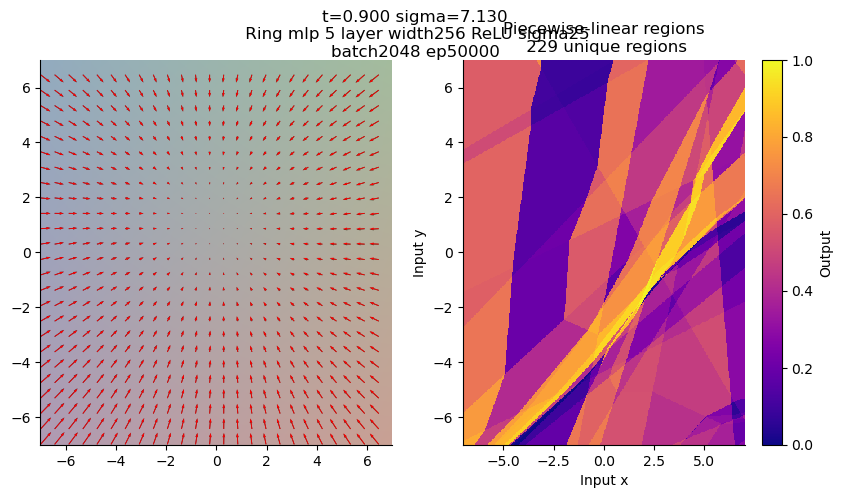

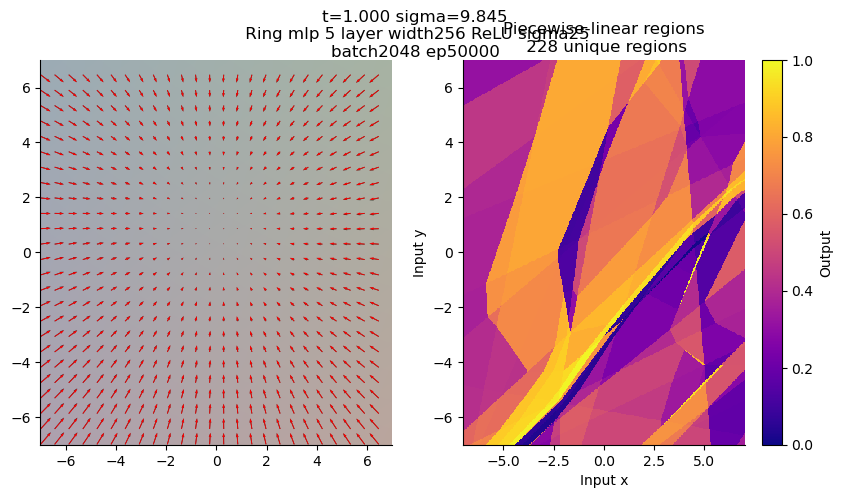

In [176]:
from core.gaussian_mixture_lib import diffuse_gmm_torch

device = "cuda"
score_model_gmm = score_model_gmm.to(device).eval()
# Define the grid
resolution = 500
xlim, ylim = (-7, 7), (-7, 7)
x = torch.linspace(*xlim, resolution)
y = torch.linspace(*ylim, resolution)
x_grid, y_grid = torch.meshgrid(x, y)
input_grid = torch.stack((x_grid, y_grid), dim=-1)
input_pnts = input_grid.reshape(-1, 2).to(device)
input_pnts.requires_grad_(True)
ndim = input_pnts.shape[-1]
for time in [0.002, 0.005, 0.01, 0.02, 0.05, *np.linspace(0.1, 1, 10)]:
    sigma = score_model_gmm.marginal_prob_std_f(time)
    gmm_sigma = diffuse_gmm_torch(gmm, time, sigma=sigma_max)
    _, weight_part = gmm_sigma.score_decompose(input_pnts.detach().cpu())
    gmm_score_gt = gmm_sigma.score(input_pnts.detach().cpu())
    gmm_score_gt = gmm_score_gt.reshape(x_grid.shape + (ndim,))
    weight_part_map = weight_part.reshape(resolution, resolution, gmm.n_component)
    sigma_vec = torch.ones(input_pnts.shape[0]).to(device) * time
    # Measure the output from score_model_td
    output_pnts = score_model_gmm(input_pnts, sigma_vec)
    # Measure the gradient with respect to the input
    jacobians = compute_gradients(input_pnts, output_pnts)
    jacobian_grid = jacobians.reshape(x_grid.shape + (ndim * ndim,))
    output_grid = output_pnts.detach().cpu().reshape(x_grid.shape + (ndim,))
    figh, axs = plot_linear_region(input_grid, output_grid, jacobian_grid,
                cmap="plasma", subsp_factor=20)
    # axs[-1].plot(x1, x2, color="k")
    # axs[0].imshow(weight_part_map[:, :,], extent=(*xlim, *ylim), origin='upper', alpha=0.5)
    axs[0].pcolormesh(x_grid, y_grid, weight_part_map[:, :,], alpha=0.5) # extent=(*xlim, *ylim), origin='upper', 
    axs[0].quiver(input_grid[::20, ::20, 0].flatten(), input_grid[::20, ::20, 1].flatten(),
                    gmm_score_gt[::20, ::20, 0].flatten(), gmm_score_gt[::20, ::20, 1].flatten(), color="r")
    figh.suptitle(f"t={time:.3f} sigma={sigma:.3f}\n {cfg_str}")
    # raise NotImplementedError
    
    

### Much deeper model for ring

In [160]:
# train_score_td
# figdir = r"/Users/binxuwang/Library/CloudStorage/OneDrive-HarvardUniversity/HaimDiffusionRNNProj/Ring_NN_train"
# gmm_X, _, _ = gmm.sample(10000)
ring_X = generate_ring_samples_torch(10000)
# train test split
# Xtrain, Xtest = ring_X, torch.empty(0, 2)  # train_test_split(ring_X, test_size=0.0001, random_state=42)
Xtrain, Xtest = train_test_split(ring_X, test_size=0.1, random_state=42)
device = "cuda"
sigma_max = 25
mlp_width = 256
mlp_depth = 5 # note, 2 layer usually doesn't work. 3 layer works.
act_fun = nn.ReLU
batch_size = 2048
epochs = 50000
cfg_str = f"Ring mlp {mlp_depth} layer width{mlp_width} {act_fun.__name__} sigma{sigma_max}\nbatch{batch_size} ep{epochs}"
torch.manual_seed(42)
score_model_ring = ScoreModel_Time_edm(sigma=sigma_max, ndim=2, act_fun=act_fun, 
                                    nhidden=mlp_width, nlayers=mlp_depth,
                                    time_embed_dim=32)
score_model_ring.to(device)
score_model_ring = train_score_td(Xtrain.to(device), score_model_td=score_model_ring,
                sigma=sigma_max, lr=0.005, nepochs=epochs, batch_size=batch_size)

step 97 loss 0.488:   0%|▏                                                                          | 98/50000 [00:00<01:43, 483.47it/s]

step 0 loss 0.569


step 458 loss 0.421:   1%|▋                                                                        | 441/50000 [00:00<01:42, 484.25it/s]

step 49999 loss 0.428: 100%|█████████████████████████████████████████████████████████████████████| 50000/50000 [01:44<00:00, 477.39it/s]


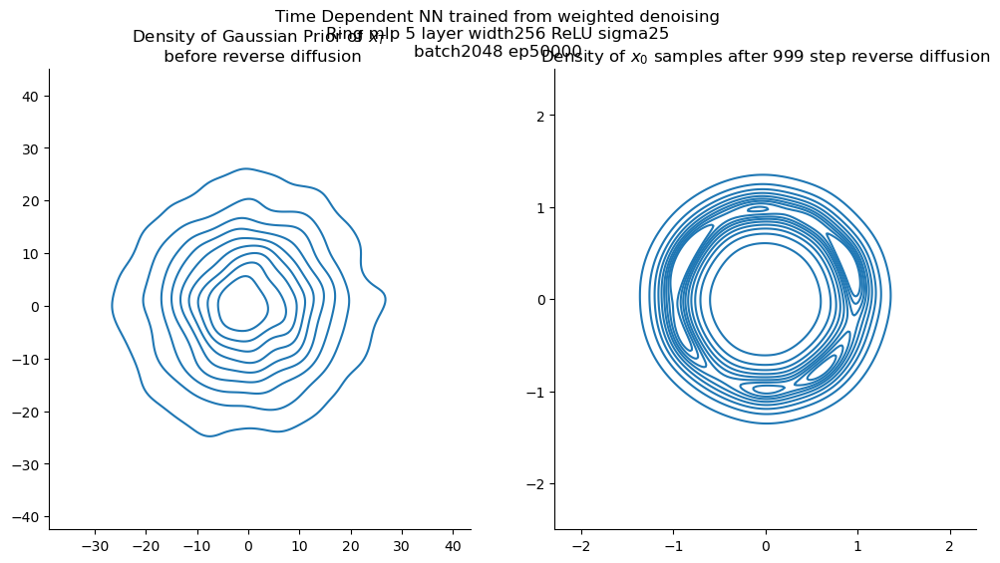

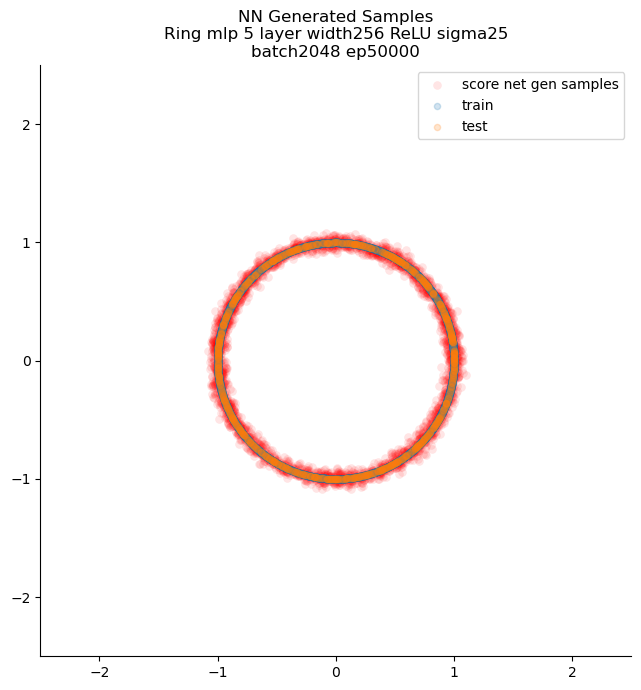

In [164]:
xlim, ylim = (-2.5, 2.5), (-2.5, 2.5)
x_traj_denoise = reverse_diffusion_time_dep(score_model_ring, sampN=3000, sigma=sigma_max, nsteps=1000, ndim=2, exact=False, device=device)
figh = visualize_diffusion_distr(x_traj_denoise,
                        explabel=f"Time Dependent NN trained from weighted denoising\n{cfg_str}")
figh.axes[1].set_xlim(xlim)
figh.axes[1].set_ylim(ylim)
# saveallforms(figdir, f"ring_NN_contour_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
figh.show()
#%%
plt.figure(figsize=(7, 7))
plt.scatter(x_traj_denoise[:, 0, -1], x_traj_denoise[:, 1, -1], alpha=0.1, lw=0.1, color="r", 
            label="score net gen samples")
plt.scatter(Xtrain[:, 0], Xtrain[:, 1], s=20, alpha=0.2, label="train", marker="o")
plt.scatter(Xtest[:, 0], Xtest[:, 1], s=20, alpha=0.2, label="test", marker="o")
plt.axis("image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.title(f"NN Generated Samples\n{cfg_str}")
plt.legend()
plt.tight_layout()
# saveallforms(figdir, f"ring_NN_samples_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
plt.show()

/tmp/ipykernel_3635512/3775582624.py:32: RuntimeWarning: invalid value encountered in true_divide
  normalized_colors = (colors_grid - colors_grid.min()) / (colors_grid.max() - colors_grid.min())


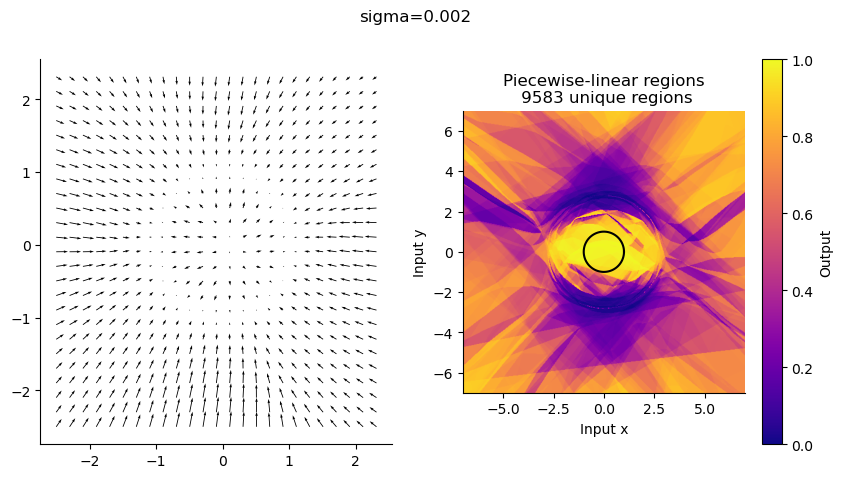

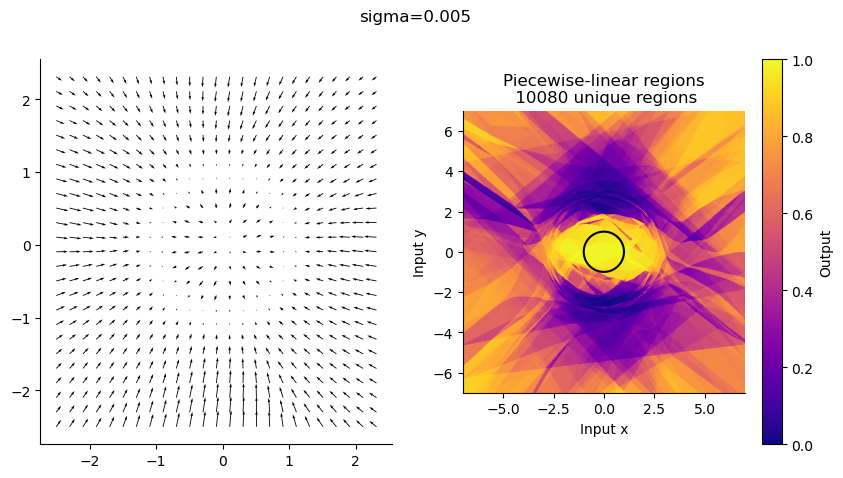

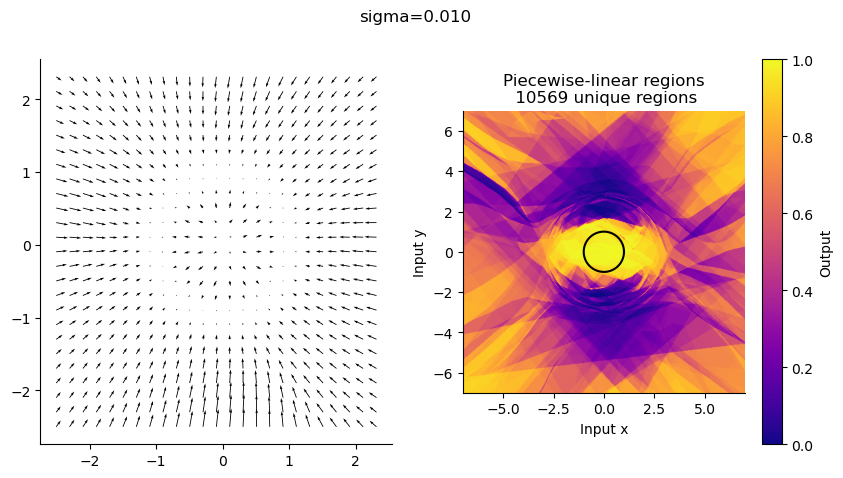

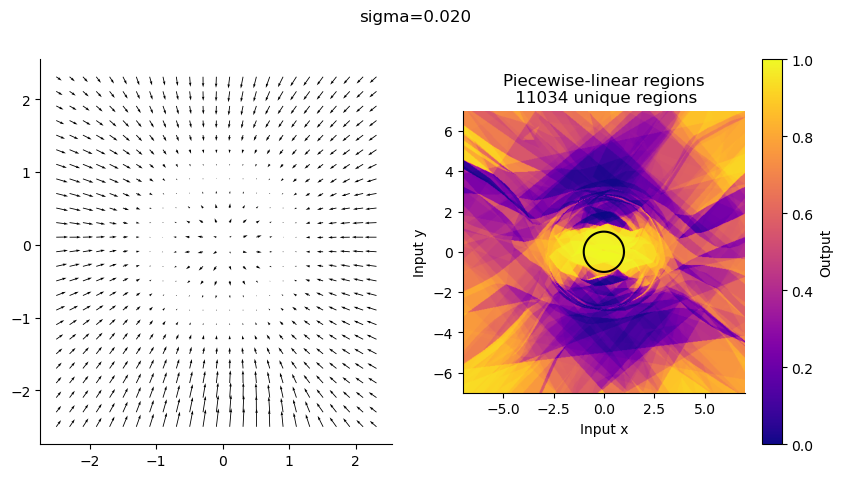

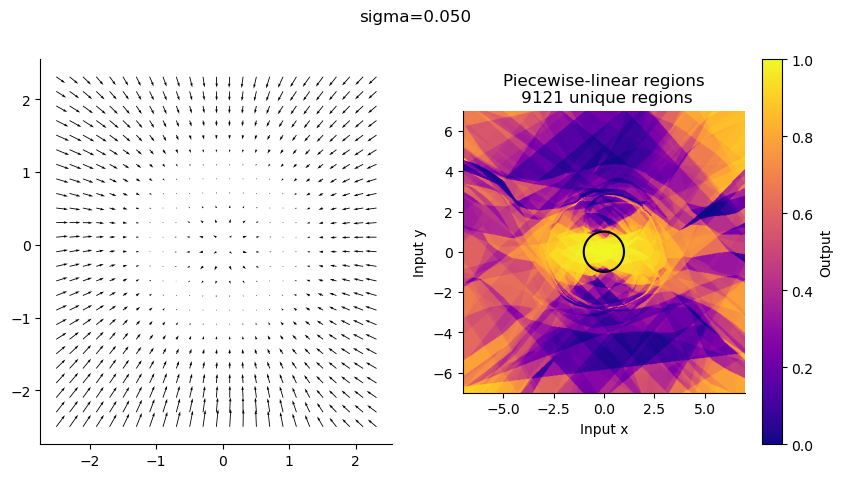

...

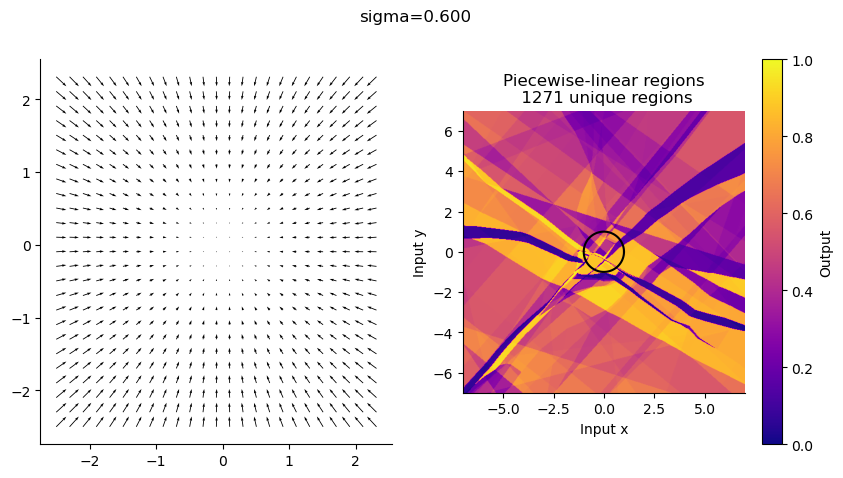

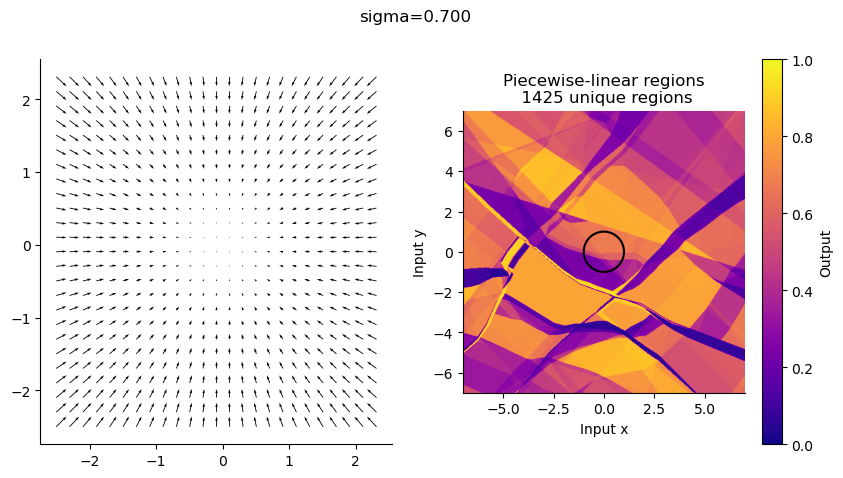

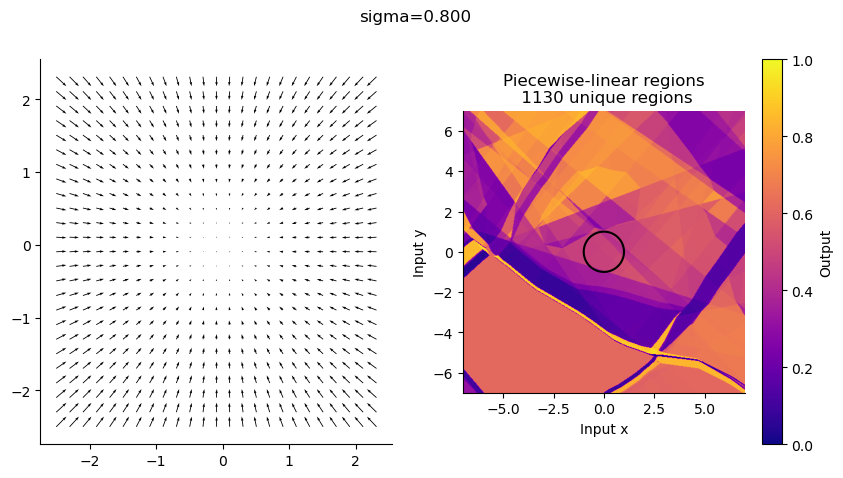

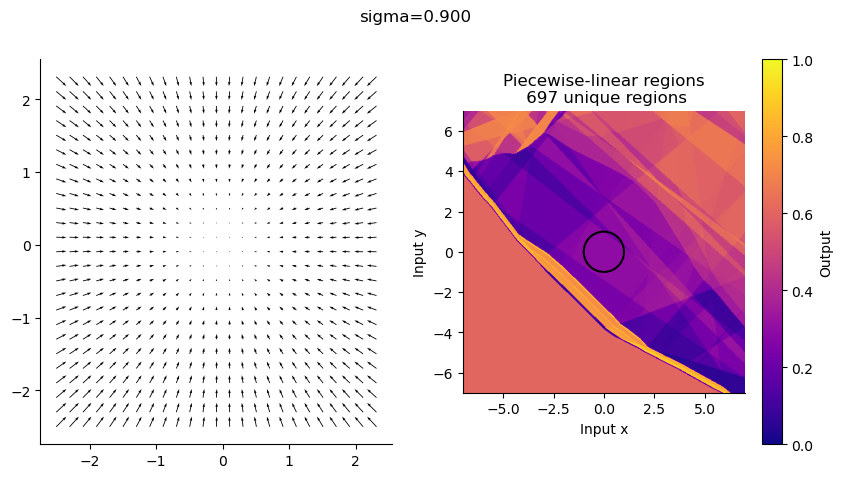

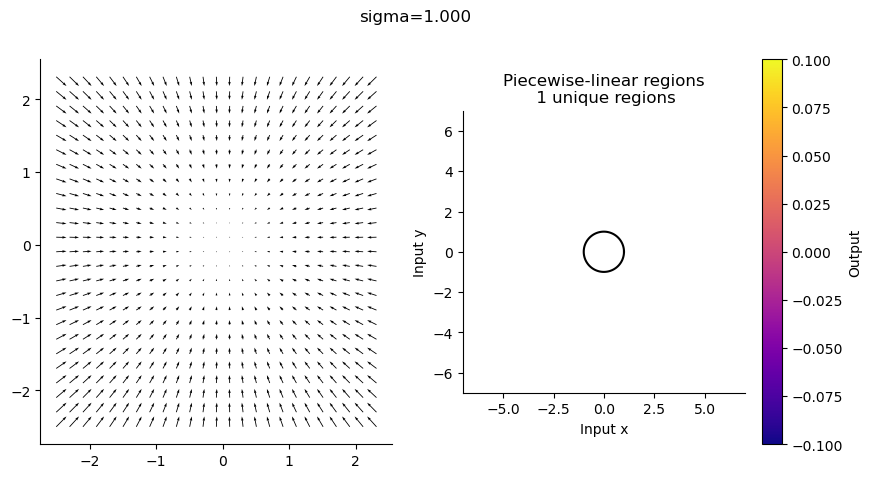

In [165]:
device = "cuda"
score_model_ring = score_model_ring.to(device).eval()
# Define the grid
resolution = 500
x = torch.linspace(*xlim, resolution)
y = torch.linspace(*ylim, resolution)
x_grid, y_grid = torch.meshgrid(x, y)
input_grid = torch.stack((x_grid, y_grid), dim=-1)
input_pnts = input_grid.reshape(-1, 2).to(device)
input_pnts.requires_grad_(True)
ndim = input_pnts.shape[-1]
for sigma in [0.002, 0.005, 0.01, 0.02, 0.05, *np.linspace(0.1, 1, 10)]:
    sigma_vec = torch.ones(input_pnts.shape[0]).to(device) * sigma
    # Measure the output from score_model_td
    output_pnts = score_model_ring(input_pnts, sigma_vec)
    # Measure the gradient with respect to the input
    jacobians = compute_gradients(input_pnts, output_pnts)
    jacobian_grid = jacobians.reshape(x_grid.shape + (ndim * ndim,))
    output_grid = output_pnts.detach().cpu().reshape(x_grid.shape + (ndim,))
    figh, axs = plot_linear_region(input_grid, output_grid, jacobian_grid,
                extent=(-7, 7, -7, 7), origin="lower", cmap="plasma",
                subsp_factor=20)
    axs[-1].plot(x1, x2, color="k")
    figh.suptitle(f"sigma={sigma:.3f}")
    figh.show()

### Heart shaped curve

Text(0, 0.5, 'Y')

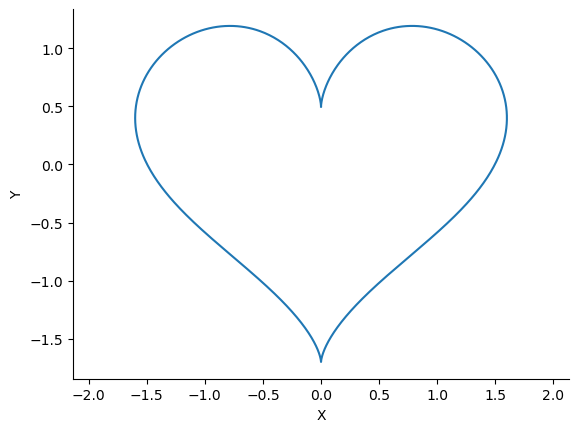

In [188]:
import torch

def generate_heart_samples(num_samples, scale=1.0):
    t = torch.linspace(0, 2 * torch.pi, num_samples)
    x = 16 * torch.sin(t) ** 3
    y = 13 * torch.cos(t) - 5 * torch.cos(2 * t) - 2 * torch.cos(3 * t) - torch.cos(4 * t)
    return torch.stack((x, y), dim=1) * scale

# Example usage:
num_samples = 1000
samples = generate_heart_samples(num_samples, scale=0.1)
plt.plot(samples[:, 0], samples[:, 1])
plt.axis('equal')
plt.xlabel('X')
plt.ylabel('Y')

In [189]:
# train_score_td
# figdir = r"/Users/binxuwang/Library/CloudStorage/OneDrive-HarvardUniversity/HaimDiffusionRNNProj/Ring_NN_train"
# gmm_X, _, _ = gmm.sample(10000)
num_samples = 10000
heart_X = samples = generate_heart_samples(num_samples, scale=0.1)
# train test split
# Xtrain, Xtest = ring_X, torch.empty(0, 2)  # train_test_split(ring_X, test_size=0.0001, random_state=42)
Xtrain, Xtest = train_test_split(heart_X, test_size=0.1, random_state=42)
device = "cuda"
sigma_max = 25
mlp_width = 256
mlp_depth = 5 # note, 2 layer usually doesn't work. 3 layer works.
act_fun = nn.ReLU
batch_size = 2048
epochs = 100000
cfg_str = f"Heart mlp {mlp_depth} layer width{mlp_width} {act_fun.__name__} sigma{sigma_max}\nbatch{batch_size} ep{epochs}"
torch.manual_seed(42)
score_model_heart = ScoreModel_Time_edm(sigma=sigma_max, ndim=2, act_fun=act_fun, 
                                    nhidden=mlp_width, nlayers=mlp_depth,
                                    time_embed_dim=32).to(device)
score_model_heart = train_score_td(Xtrain.to(device), score_model_td=score_model_heart,
                sigma=sigma_max, lr=0.005, nepochs=epochs, batch_size=batch_size)

step 92 loss 0.538:   0%|                                                                          | 93/100000 [00:00<03:37, 458.56it/s]

step 0 loss 0.662


step 99999 loss 0.515: 100%|███████████████████████████████████████████████████████████████████| 100000/100000 [03:30<00:00, 474.62it/s]


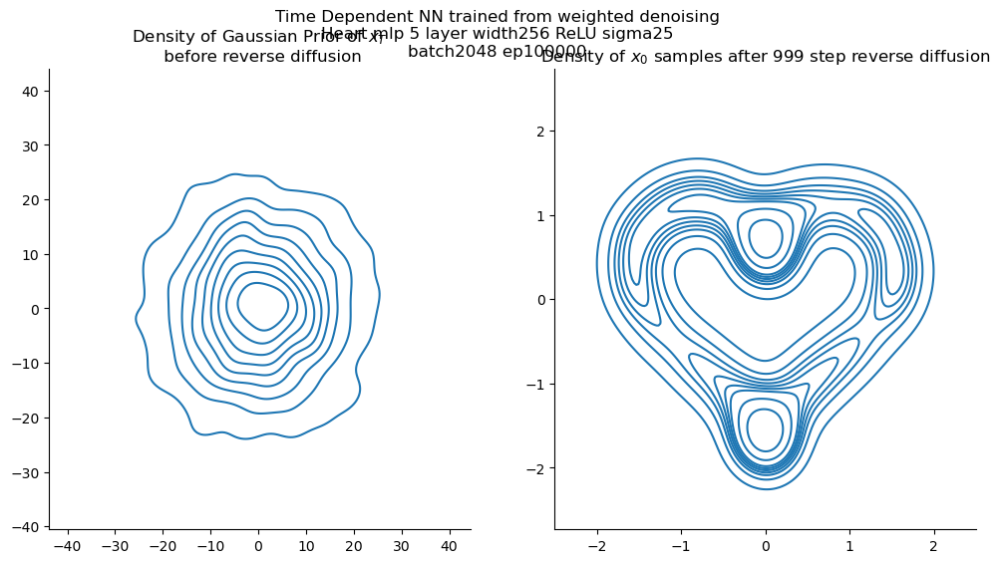

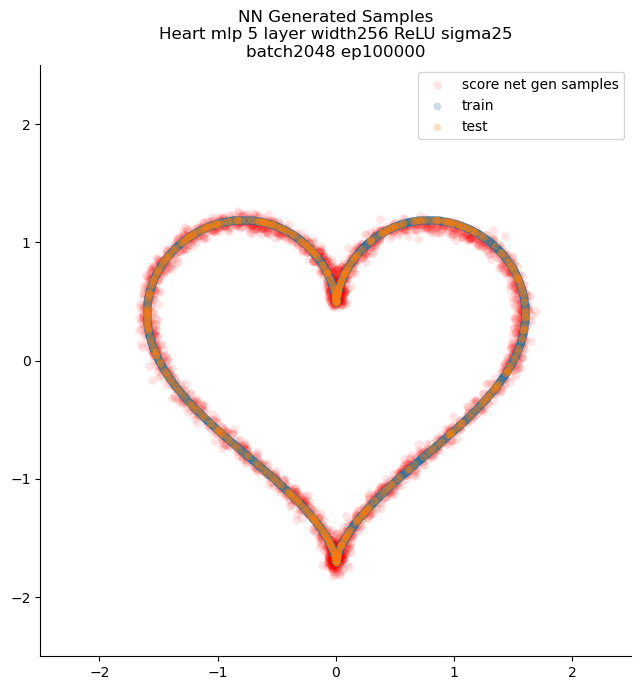

In [191]:
xlim, ylim = (-2.5, 2.5), (-2.5, 2.5)
x_traj_denoise = reverse_diffusion_time_dep(score_model_heart, sampN=3000, sigma=sigma_max, nsteps=1000, ndim=2, exact=False, device=device)
figh = visualize_diffusion_distr(x_traj_denoise,
                        explabel=f"Time Dependent NN trained from weighted denoising\n{cfg_str}")
figh.axes[1].set_xlim(xlim)
figh.axes[1].set_ylim(ylim)
# saveallforms(figdir, f"ring_NN_contour_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
figh.show()
#%%
plt.figure(figsize=(7, 7))
plt.scatter(x_traj_denoise[:, 0, -1], x_traj_denoise[:, 1, -1], alpha=0.1, lw=0.1, color="r", 
            label="score net gen samples")
plt.scatter(Xtrain[:, 0], Xtrain[:, 1], s=20, alpha=0.2, label="train", marker="o")
plt.scatter(Xtest[:, 0], Xtest[:, 1], s=20, alpha=0.2, label="test", marker="o")
plt.axis("image")
plt.xlim(xlim)
plt.ylim(ylim)
plt.title(f"NN Generated Samples\n{cfg_str}")
plt.legend()
plt.tight_layout()
# saveallforms(figdir, f"ring_NN_samples_train_mlp{mlp_depth}_{mlp_width}_batch{batch_size}_ep{epochs:04d}_sde")
plt.show()

In [192]:
heart_x, heart_y = generate_heart_samples(1000, scale=0.1).T

/tmp/ipykernel_3635512/3514865739.py:33: RuntimeWarning: invalid value encountered in true_divide
  normalized_colors = (colors_grid - colors_grid.min()) / (colors_grid.max() - colors_grid.min())


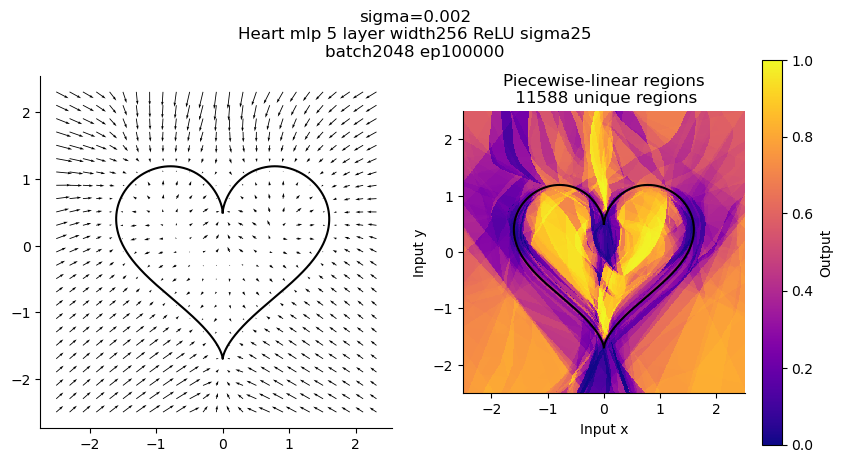

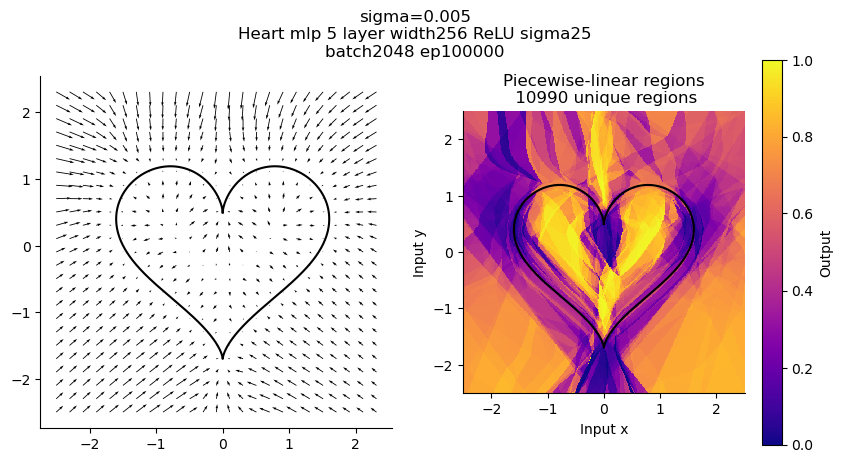

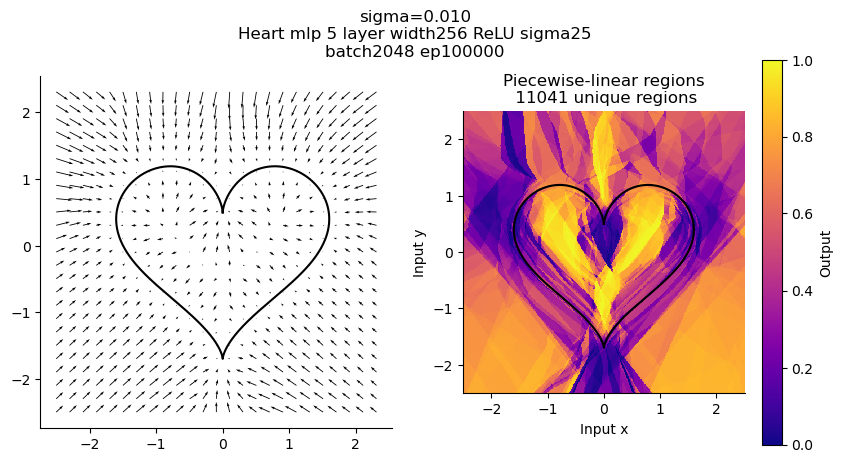

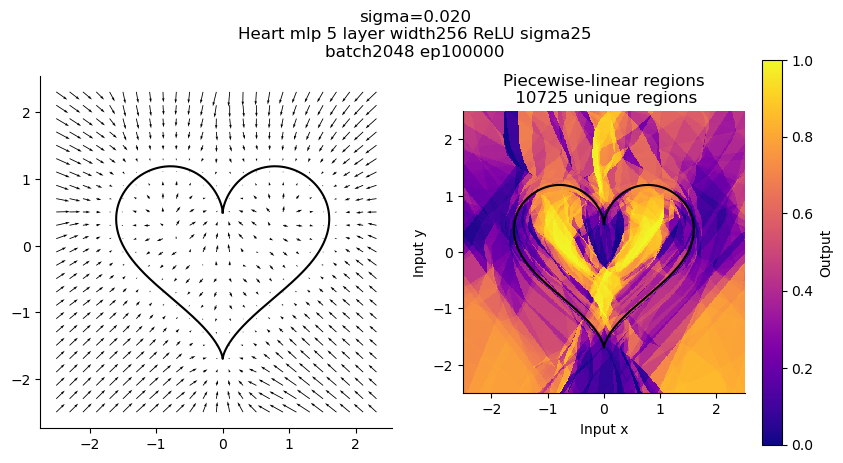

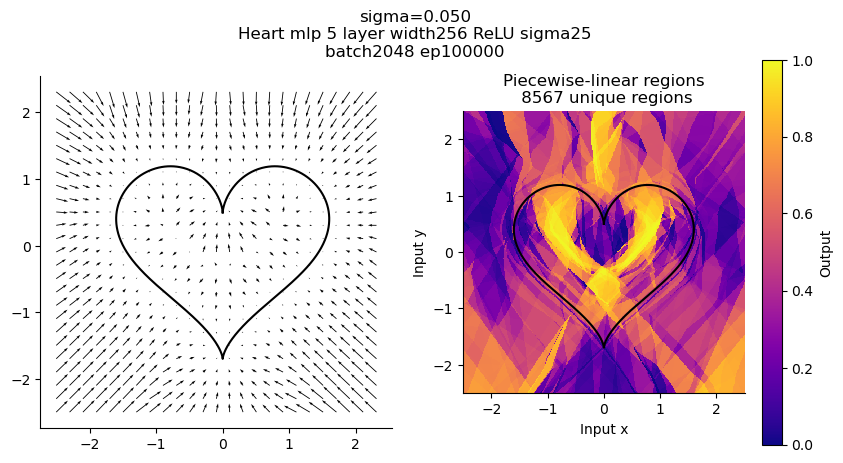

...

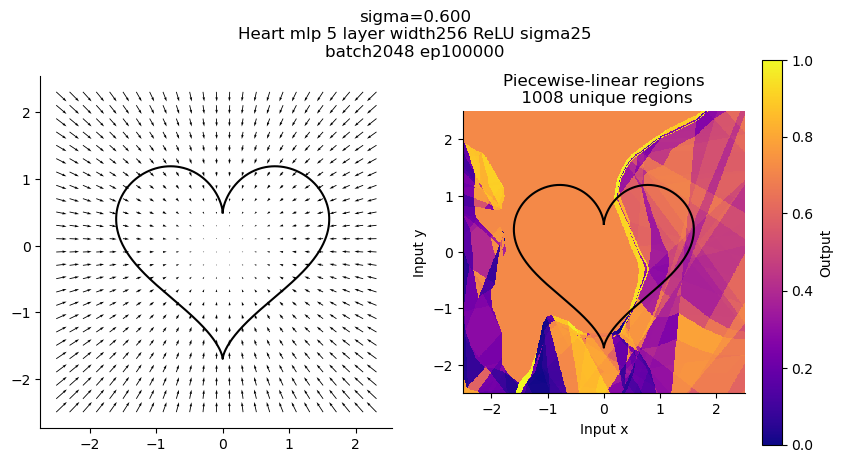

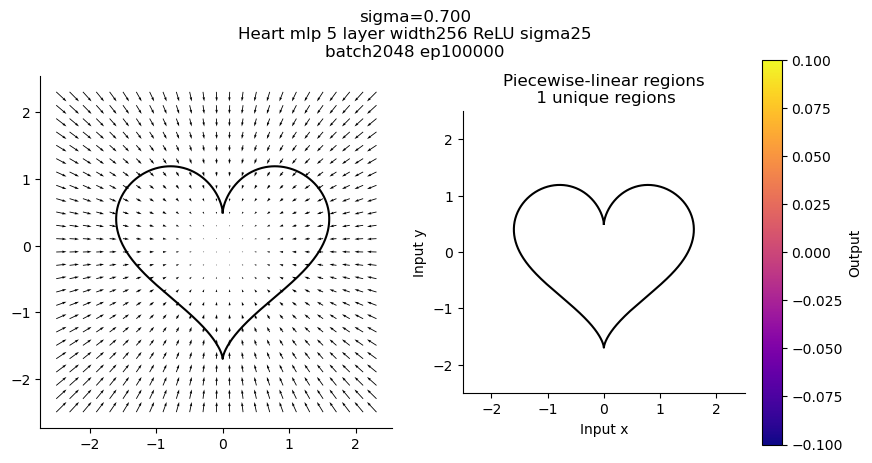

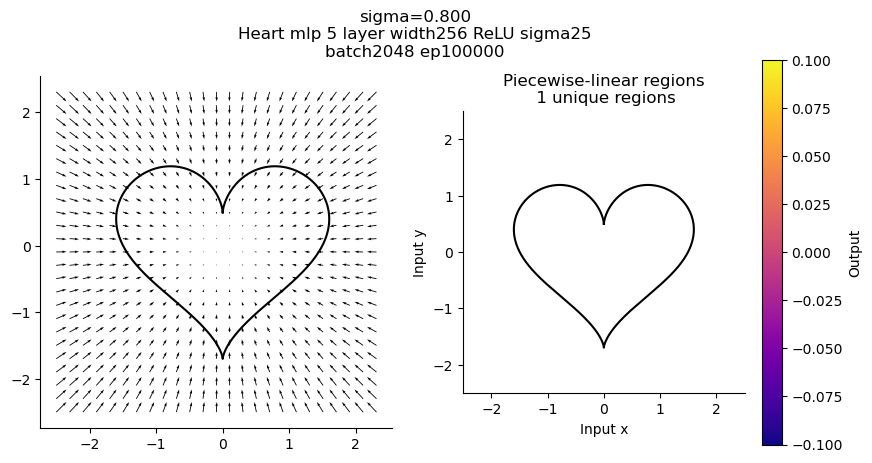

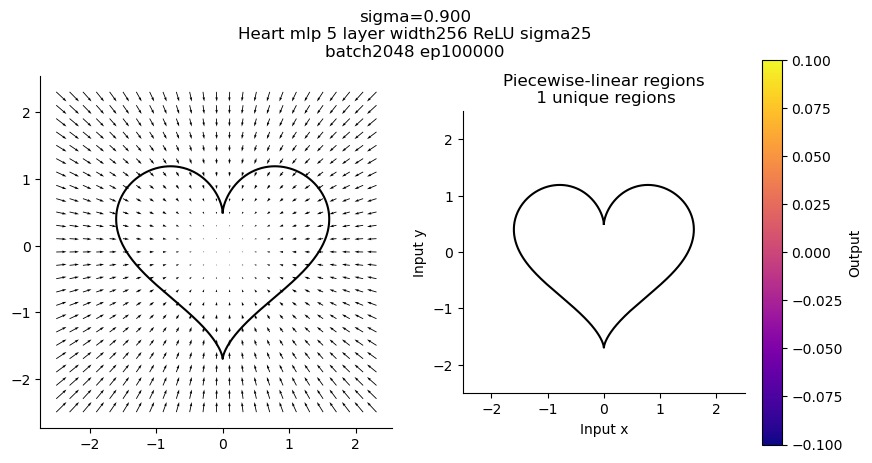

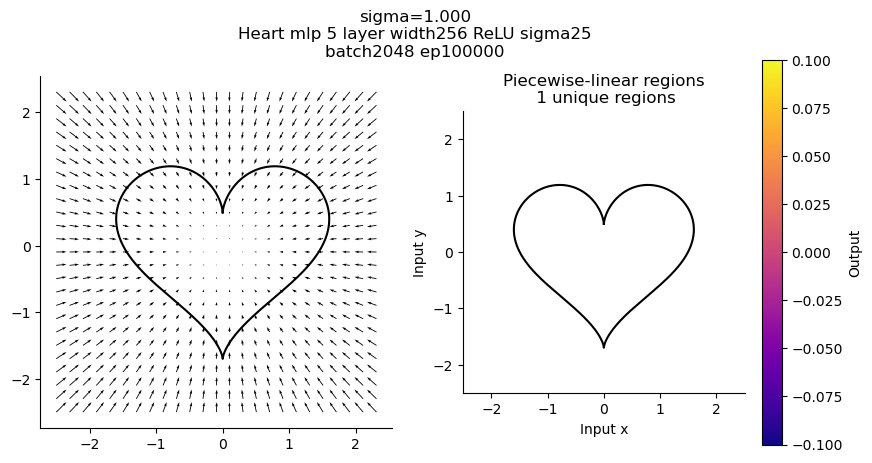

In [198]:
device = "cuda"
score_model_heart = score_model_heart.to(device).eval()
# Define the grid
resolution = 500
x = torch.linspace(*xlim, resolution)
y = torch.linspace(*ylim, resolution)
x_grid, y_grid = torch.meshgrid(x, y)
input_grid = torch.stack((x_grid, y_grid), dim=-1)
input_pnts = input_grid.reshape(-1, 2).to(device)
input_pnts.requires_grad_(True)
ndim = input_pnts.shape[-1]
for sigma in [0.002, 0.005, 0.01, 0.02, 0.05, *np.linspace(0.1, 1, 10)]:
    sigma_vec = torch.ones(input_pnts.shape[0]).to(device) * sigma
    # Measure the output from score_model_td
    output_pnts = score_model_heart(input_pnts, sigma_vec)
    # Measure the gradient with respect to the input
    jacobians = compute_gradients(input_pnts, output_pnts)
    jacobian_grid = jacobians.reshape(x_grid.shape + (ndim * ndim,))
    output_grid = output_pnts.detach().cpu().reshape(x_grid.shape + (ndim,))
    figh, axs = plot_linear_region(input_grid, output_grid, jacobian_grid,
                extent=(*xlim, *ylim), origin="lower", cmap="plasma",
                subsp_factor=20)
    # axs[-1].plot(x1, x2, color="k")
    axs[-1].plot(heart_x, heart_y, color="k")
    axs[0].plot(heart_x, heart_y, color="k")
    figh.suptitle(f"sigma={sigma:.3f}\n{cfg_str}")
    figh.show()
    # raise NotImplementedError